In [115]:
TF_NEW = True

In [102]:
import pickle
import os
import numpy as np
import pandas as pd
from nltk import ngrams
from sklearn.metrics import accuracy_score
import math
import blosum as bl
import torch
from torcheval.metrics.text import Perplexity
import decimal
import statistics
from scipy import stats
import platform
import matplotlib.pyplot as plt
# desired precision for printing float values
#decimal.getcontext().prec = 18
query = "file" # 'file'
directory_path = 'results_noGit/IMPORTANTS/'#'data_specific_enzymes/results/' #'data_enzymes_classes/results/'#'data_halogenase/' # 'data_enzymes_classes/results/' 
experiments = os.listdir(directory_path)
with open('mapping_files/aa_to_ctrl_idx.p','rb') as handle:
    aa_to_ctrl_idx = pickle.load(handle)
vocab_loc = 'mapping_files/vocab.txt'
use_py3 = platform.python_version()[0] == '3'
vocab = open(vocab_loc).readlines() if not use_py3 else open(vocab_loc, encoding='utf-8').read().split('\n')[:-1]
vocab = list(map(lambda x: x.split(' ')[0], vocab))
vocab_size = len(vocab)

after_training_experiments = os.listdir(directory_path + '')

print(experiments)
print('-----')
print(after_training_experiments)

['Test_teacherforcing_k_1_general_model_lysozymes_KEYS_test_REDUCED', 'PF00959_test_data_no_kw_p_0_topk_1', 'PF00959_teacher_forcing_ALL_TRAINING_4_TRAINING_2000_p_0_k_1_key_only_0', 'Test_after20_k_1_finetuned_model_ALL_LYSOZYMES_KEYS_test_10percent', 'Test_after20_k_1_general_model_KEYS_model_lysozymes_test_filtered', 'Test_after20_k_1_finetuned_model_KEYS_model_lysozymes_test_filtered', 'PF00959_generalModel_after_20_proteins_2000_p_0_k_1_key_only_0', 'Test_teacherforcing_k_1_finetuned_model_ALL_LYSOZYMES_KEYS_test_filtered', 'Test_teacherforcing_k_1_fine_tuned_model_lysozymes_KEYS_test_REDUCED', 'Test_teacherforcing_k_1_finetuned_model_ALL_LYSOZYMES_KEYS_test_10percent', 'Test_after20_k_1_finetuned_model_ALL_LYSOZYMES_KEYS_test_FILTERED', 'PF00959_after_20_TRAINING_4_2000_p_0_k_1_key_only_0']
-----
['Test_teacherforcing_k_1_general_model_lysozymes_KEYS_test_REDUCED', 'PF00959_test_data_no_kw_p_0_topk_1', 'PF00959_teacher_forcing_ALL_TRAINING_4_TRAINING_2000_p_0_k_1_key_only_0', 'Te

<p>To evaluate the generated sequence using teacher forcing:

1. Generate the Sequence: The transformer model with teacher forcing generates the complete sequence. 
At each time step, we provide the true input sequence (+ 1 versus previous step), as input to the model.

2. Calculate Metrics: Accuracy, soft accuracy (based on BLOSUM matrix), perplexity. 

</p>

In [87]:
blosum = pd.read_csv('blosum/blosum62.csv')
blosum['X']['X'] = 1
blosum = blosum.drop(['*'], axis=0)
blosum = blosum.drop(['*'], axis=1)
blosum['U'] = -3
blosum.loc['U'] = -3
blosum['O'] = -3
blosum.loc['O'] = -3
blosum['O']['O']=2
blosum['O']['K']=1
blosum['K']['O']=0
blosum['U']['U']=2
blosum['U']['C']=1
blosum['C']['U']=0
blosum

,A,R,N,D,C,Q,E,G,H,I,...,S,T,W,Y,V,B,Z,X,U,O
A,4,-1,-2,-2,0,-1,-1,0,-2,-1,...,1,0,-3,-2,0,-2,-1,0,-3,-3
R,-1,5,0,-2,-3,1,0,-2,0,-3,...,-1,-1,-3,-2,-3,-1,0,-1,-3,-3
N,-2,0,6,1,-3,0,0,0,1,-3,...,1,0,-4,-2,-3,3,0,-1,-3,-3
D,-2,-2,1,6,-3,0,2,-1,-1,-3,...,0,-1,-4,-3,-3,4,1,-1,-3,-3
C,0,-3,-3,-3,9,-3,-4,-3,-3,-1,...,-1,-1,-2,-2,-1,-3,-3,-2,1,-3
Q,-1,1,0,0,-3,5,2,-2,0,-3,...,0,-1,-2,-1,-2,0,3,-1,-3,-3
E,-1,0,0,2,-4,2,5,-2,0,-3,...,0,-1,-3,-2,-2,1,4,-1,-3,-3
G,0,-2,0,-1,-3,-2,-2,6,-2,-4,...,0,-2,-2,-3,-3,-1,-2,-1,-3,-3
H,-2,0,1,-1,-3,0,0,-2,8,-3,...,-1,-2,-2,2,-3,0,0,-1,-3,-3
I,-1,-3,-3,-3,-1,-3,-3,-4,-3,4,...,-2,-1,-3,-1,3,-3,-3,-1,-3,-3


In [88]:
#  BLOSUM62 is the matrix built using sequences with less than 62% similarity 
# (sequences with ≥ 62% identity were clustered)

def compute_hard_accuracy(true_string, predicted_string):
    # percentage of predictions that exactly match the ground truth labels
    total_characters = len(true_string)
    assert total_characters == len(predicted_string)
    # Convert strings to lists of characters
    true_list = list(true_string)
    predicted_list = list(predicted_string)
    # Compute hard accuracy using accuracy_score function
    hard_accuracy = accuracy_score(true_list, predicted_list)
    return hard_accuracy

def compute_all_hard_accuracies(true_sequences, predicted_sequences):
    num_seq = len(true_sequences)
    assert num_seq == len(predicted_sequences)
    accuracy_all = []
    accuracy_dict = {}
    accuracy_512 = []
    for i in range(0, 8000, 50):
        accuracy_dict[i] = []
    for i in range(num_seq):
        sequence = true_sequences[i]
        predicted_sequence = predicted_sequences[i]
        tmp_acc = compute_hard_accuracy(sequence, predicted_sequence)
        accuracy_all.append(tmp_acc)
        for j in range(0, len(sequence)-49, 50):
            tmp_acc_ranges = compute_hard_accuracy(sequence[j:j+50], predicted_sequence[j:j+50])
            accuracy_dict[j].append(float(tmp_acc_ranges))
            
        # results for size max 512
        if len(sequence) >= 512:
            tmp_acc_512 = compute_hard_accuracy(sequence[:512], predicted_sequence[:512])
        else:
            tmp_acc_512 = tmp_acc
        accuracy_512.append(tmp_acc_512)
    # fuori dal for:
    result_512 = sum(accuracy_512) / num_seq
    st_deviation_512 = np.std(accuracy_512)
    result_512 = (float(result_512), float(st_deviation_512))
    
    
    result = sum(accuracy_all) / num_seq
    for key in accuracy_dict:
        if len(accuracy_dict[key]) <= 0:
            break
        if len(accuracy_dict[key]) < 2:
            accuracy_dict[key] = (sum(accuracy_dict[key])/len(accuracy_dict[key]), 0.0)
        else:
            accuracy_dict[key] = (sum(accuracy_dict[key])/len(accuracy_dict[key]), statistics.stdev(accuracy_dict[key]))
    st_deviation = statistics.stdev(accuracy_all)
    result = (result, st_deviation)
    return result, result_512, accuracy_dict, accuracy_all

def compute_soft_accuracies(true_sequences, predicted_sequences, threshold = 0):
    # soft accuracy takes into account partial matches or similarities 
    # between the predictions and the ground truth labels
    bl_matrix = bl.BLOSUM(62)
    num_seq = len(true_sequences)
    assert num_seq == len(predicted_sequences)
    accuracy_all = []
    accuracy_dict = {}
    accuracy_512 = []
    for i in range(0, 8000, 50):
        accuracy_dict[i] = []
    for i in range(num_seq):
        sequence = true_sequences[i]
        predicted_sequence = predicted_sequences[i]
        tmp_acc = calculate_soft_accuracy(sequence, predicted_sequence, bl_matrix, threshold)
        accuracy_all.append(tmp_acc)
        for j in range(0, len(sequence)-49, 50):
            tmp_acc_ranges = calculate_soft_accuracy(sequence[j:j+50], predicted_sequence[j:j+50], bl_matrix, threshold)
            accuracy_dict[j].append(tmp_acc_ranges) 
        # results for size max 512
        if len(sequence) >= 512:
            tmp_sacc_512 = calculate_soft_accuracy(sequence[:512], predicted_sequence[:512], bl_matrix, threshold)
        else:
            tmp_sacc_512 = tmp_acc
        accuracy_512.append(tmp_sacc_512)
    # fuori dal for:
    result_512 = sum(accuracy_512) / num_seq
    st_deviation_512 = np.std(accuracy_512)
    result_512 = (float(result_512), float(st_deviation_512))
    
    
    result = sum(accuracy_all) / num_seq
    for key in accuracy_dict:
        if len(accuracy_dict[key]) <= 0:
            break
        if len(accuracy_dict[key]) < 2:
            accuracy_dict[key] = (sum(accuracy_dict[key])/len(accuracy_dict[key]), 0.0)
        else:
            accuracy_dict[key] = (sum(accuracy_dict[key])/len(accuracy_dict[key]), statistics.stdev(accuracy_dict[key]))
    st_deviation = statistics.stdev(accuracy_all)
    result = (result, st_deviation)
    return result, result_512, accuracy_dict, accuracy_all


def calculate_soft_accuracy(true_sequence, predicted_sequence, bl_matrix, threshold = 0):
    total_characters = len(true_sequence)
    assert total_characters == len(predicted_sequence)
    partial_matches = 0
    for true_aa, predicted_aa in zip(true_sequence, predicted_sequence):
        #similarity_score = bl_matrix[true_aa][predicted_aa]
        similarity_score_new = blosum[str(true_aa)][str(predicted_aa)]
        similarity_score = similarity_score_new
        if similarity_score >= threshold:
            partial_matches += 1
    soft_accuracy = partial_matches / total_characters
    return soft_accuracy


def compute_perplexity_new(probs, indexes):
    ppls = []  # List to store perplexity for each sequence in the batch
    with torch.no_grad():
        for sample_i in range(probs.shape[0]):  # Each sample in batch
            y_pred, y_actual = probs[sample_i], indexes[sample_i]

            # Apply softmax along the class dimension (assuming it's not applied yet)
            #y_pred = torch.nn.functional.softmax(y_pred, dim=1)

            # Compute log probability of the true labels
            ent = torch.log(y_pred[range(y_pred.shape[0]), y_actual])

            # Compute average negative log likelihood
            avg_nll = -torch.mean(ent)

            # Compute perplexity
            ppl = torch.exp(avg_nll).item()
            ppls.append(ppl)

    # Compute average perplexity across the batch
    avg_perplexity = sum(ppls) / len(ppls)
    return avg_perplexity



def compute_perplexity(probs, true_sequence): 
    true_sequence_ctrl_codes = [aa_to_ctrl_idx[code]-vocab_size+26 for code in true_sequence]
    #print('true_sequence_ctrl_codes: ', true_sequence_ctrl_codes)
    indexes_new = torch.tensor(true_sequence_ctrl_codes).view(1, len(true_sequence_ctrl_codes))
    #print('indexes_new: ', indexes_new)
    #print('indexes_new sh: ', indexes_new.shape)
    probs_new = probs.unsqueeze(0)  # new shape will be torch.Size([1, 149, 1, 25])
    #print('probs_new 1: ', probs_new)
    #print('probs_new 1 sh: ', probs_new.shape)
    # Removing the singleton dimension at position 2 (0-indexed)
    probs_new = probs_new.squeeze(2)  # new shape will be torch.Size([1, 149, 25])
    #print('probs_new 2 sh: ', probs_new.shape)
    #metric = Perplexity()
    #input_p = probs_new
    #target = indexes_new
    #metric.update(input_p, target)
    #perplexity = metric.compute()
    
    #print("new ppx: ", compute_perplexity_new(probs_new, indexes_new))
    #print("my ppx: ", perplexity)
    perplexity = compute_perplexity_new(probs_new, indexes_new)
    
    
    #print("probs.shape: ", probs.shape)
    #print("indexes.shape: ", indexes.shape)
    #print("probs: ", probs)
    #print("indexes: ", indexes)
    return perplexity

def compute_perplexities(probs_all, true_sequences_all, predicted_data, save_high_low_seq_dir=''):
    num_seq = len(true_sequences_all)
    """try:
        indexes_all[0][0][0]
    except TypeError: 
        indexes = torch.tensor(indexes_all)
        probs = torch.tensor(probs_all)
        tmp_perplexity = compute_perplexity(probs, indexes)
        return tmp_perplexity
    """
    assert num_seq == len(probs_all)
    perplexity_all = []
    perplexity_512 = []
    perplexity_dict = {}
    pp_x_filtered = []
    n_ppx_filtered = num_seq
    sequences_low_ppx = []
    sequences_high_ppx = []
    for i in range(0, 8000, 50):
        perplexity_dict[i] = []
    for i in range(num_seq):
        true_sequence = true_sequences_all[i]
        if TF_NEW == False:
            true_sequence = true_sequence[1:]
        else: 
            true_sequence = true_sequence[:-1]
        probs = torch.tensor(probs_all[i])
        tmp_perplexity = compute_perplexity(probs, true_sequence)
        # TESTING
        if tmp_perplexity <= 18:
            pp_x_filtered.append(tmp_perplexity)
            sequences_low_ppx.append(predicted_data[i])
        elif tmp_perplexity >= 100:
            sequences_high_ppx.append(predicted_data[i])
            n_ppx_filtered -= 1
        else:
            n_ppx_filtered -= 1
        perplexity_all.append(tmp_perplexity)
        for j in range(0, len(true_sequence)-49, 50):
            tmp_per = compute_perplexity(probs[j:j+50], true_sequence[j:j+50])
            perplexity_dict[j].append(tmp_per)  
        
        # results for size max 512
        if len(probs) >= 512:
            tmp_perp_512 = compute_perplexity(probs[:512], true_sequence[:512])
        else:
            tmp_perp_512 = tmp_perplexity
        perplexity_512.append(tmp_perp_512)

    print('filtered ppx less than 18: how many?:', n_ppx_filtered)
    if n_ppx_filtered != 0:
        print('value mean:', sum(pp_x_filtered)/n_ppx_filtered)
    data_dir = save_high_low_seq_dir
    if data_dir != '':
        with open(data_dir+'highppx.p', "wb") as file:
            pickle.dump(sequences_high_ppx, file)
        with open(data_dir+'lowppx.p', "wb") as file:
            pickle.dump(sequences_low_ppx, file)
    #plt.hist(perplexity_all, bins=30, range=(0, 50))
    #plt.show()
    # fuori dal for:
    result_512 = sum(perplexity_512) / num_seq
    st_deviation_512 = np.std(perplexity_512)
    result_512 = (float(result_512), float(st_deviation_512))
    
    
    result = sum(perplexity_all) / num_seq
    for key in perplexity_dict:
        if len(perplexity_dict[key]) <= 0:
            break
        if len(perplexity_dict[key]) < 2:
            perplexity_dict[key] = (float(sum(perplexity_dict[key])/len(perplexity_dict[key])), 0.0)
        else:
            perplexity_dict[key] = (float(sum(perplexity_dict[key])/len(perplexity_dict[key])), np.std(perplexity_dict[key]))
    st_deviation = np.std(perplexity_all) # OR np.std
    result = (float(result), float(st_deviation))
    return result, result_512, perplexity_dict, perplexity_all

In [109]:
# 0 if teacher forcing, n-1 if after-n
OFFSET = 0
MAX_LEN = 511
def compute_stats(data_dir):
    # paths to the saved .p files
    if os.path.exists(os.path.join(data_dir, "predicted_data.p")):
        predicted_data_file = os.path.join(data_dir, "predicted_data.p")
        true_data_file = os.path.join(data_dir, "true_data.p")
        indexes_all_data_file = os.path.join(data_dir, "true_tokens_index_data.p")
        probs_all_data_file = os.path.join(data_dir, "tokens_probs_data.p")
    else:
        predicted_data_file = os.path.join(data_dir, "predicted_data_" + query + ".p")
        true_data_file = os.path.join(data_dir, "true_data_" + query + ".p")
        indexes_all_data_file = os.path.join(data_dir, "true_tokens_index_data_" + query + ".p")
        probs_all_data_file = os.path.join(data_dir, "tokens_probs_data_" + query + ".p")
    
    # Reload predicted_data from the .p file
    predicted_data = False
    with open(predicted_data_file, "rb") as file:
        predicted_data = pickle.load(file)

    # Reload true_data from the .p file
    true_data = False
    with open(true_data_file, "rb") as file:
        true_data = pickle.load(file)

    # Reload probs_all_data from the .p file
    probs_all_data = False
    with open(probs_all_data_file, "rb") as file:
        probs_all_data = pickle.load(file)

    # Reload indexes_all_data from the .p file
    indexes_all_data = False
    with open(indexes_all_data_file, "rb") as file:
        indexes_all_data = pickle.load(file)
    indices_to_remove = []
    for i in range(len(predicted_data)):
        predicted_data[i] = predicted_data[i][OFFSET:MAX_LEN]
        true_data[i] = true_data[i][OFFSET:MAX_LEN]
        probs_all_data[i] = probs_all_data[i][:MAX_LEN - OFFSET]
        #print(predicted_data[i])
        #print(true_data[i])
        if len(probs_all_data[i])==511:
            # print('case 1')
            offset = 511 - 1
            probs_all_data[i] = probs_all_data[i][:offset]
        elif len(probs_all_data[i]) == len(true_data[i]):
            # print('case 2')
            offset = len(true_data[i]) - 1
            probs_all_data[i] = probs_all_data[i][:offset]
        #print('probs: ', len(probs_all_data[i]))
        #print('true_sequence: ', len(true_data[i]))
        #print('predicted_data: ', len(predicted_data[i]))
        if len(true_data[i]) <= 1:
            indices_to_remove.append(i)
    for index in sorted(indices_to_remove, reverse=True):
        del predicted_data[index]
        del true_data[index]
        del probs_all_data[index]
    #true_data = [x for x in true_data if x is not None and x != 'NaN']

    # Compute hard accuracy
    accuracy, accuracy_512, accuracy_dict, acc_values = compute_all_hard_accuracies(true_data, predicted_data)

    # Compute perplexity
    perplexity, perplexity_512, perplexity_dict, ppx_values = compute_perplexities(probs_all_data, true_data, predicted_data, '') # 'data_halogenase/analysis_high_and_low_ppx/'
    
    # Compute soft accuracy
    soft_accuracy, soft_accuracy_512, soft_accuracy_dict, soft_acc_values = compute_soft_accuracies(true_data, predicted_data)
    
    accuracy_dict[450]=[]
    soft_accuracy_dict[450]=[]
    perplexity_dict[450]=[]
        

    results = " & $" + str(round(accuracy[0]*100, 3)) + "$/$" + str(round(accuracy[1]*100, 3)) + "$ & $"
    results += str(round(soft_accuracy[0]*100, 3)) + "$/$" + str(round(soft_accuracy[1]*100, 3)) + "$ & $" 
    results += str(round(perplexity[0], 3)) + "$/$" + str(round(perplexity[1], 3)) + "$ "
    
    results_512 = " & $" + str(round(accuracy_512[0]*100, 3)) + "$/$" + str(round(accuracy_512[1]*100, 3)) + "$ & $"
    results_512 += str(round(soft_accuracy_512[0]*100, 3)) + "$/$" + str(round(soft_accuracy_512[1]*100, 3)) + "$ & $" 
    results_512 += str(round(perplexity_512[0], 3)) + "$/$" + str(round(perplexity_512[1], 3)) + "$ "
    #print("\n\nAccuracy dict:", accuracy_dict, "\n\nSoft accuracy dict:", 
    #      soft_accuracy_dict, "\n\nPerplexity dict: ", perplexity_dict)

    all_vals = [acc_values, soft_acc_values, ppx_values]

    return results, results_512, accuracy_dict, soft_accuracy_dict, perplexity_dict, all_vals
    

In [90]:
def stats_graphs(accur_dict, soft_accur_dict, perplex_dict, name):
    # Filter out the empty values for perplexity
    x_values_perplexity = ['['+str(x+1)+'-'+str(x+50)+']' for x in accur_dict.keys() if perplex_dict[x]]
    
    perplexity_stds = [perplex_dict[x][1] for x in accur_dict.keys() if perplex_dict[x]]
    perplexity_values = [perplex_dict[x][0] for x in accur_dict.keys() if perplex_dict[x]]

    # Plot accuracy and soft accuracy on one graph
    plt.figure(figsize=(10, 6), dpi=400)

    plt.plot(x_values_perplexity, perplexity_values, label='Perplexity', color=(70/255, 163/255, 139/255), antialiased=True)
    
    plt.fill_between(x_values_perplexity, np.array(perplexity_values) - np.array(perplexity_stds), 
                     np.array(perplexity_values) + np.array(perplexity_stds), alpha=0.2, color=(70/255, 163/255, 139/255))

    # Set labels and title
    #plt.xlabel('Range', fontsize=13)
    #plt.ylabel('Perplexity', fontsize=13)
    #plt.title('Perplexity over ranges', fontsize=15)
    #plt.legend()

    plt.ylim(0, 15000)  # Set ylim to ensure zero is within the range
    plt.xlim(-0.2, 8.2)  # Set xlim to ensure zero is within the range

    # Show the plot
    plt.grid(True, color=(0.8, 0.8, 0.8))
    plt.savefig(name + '_perplexity.svg')
    #plt.show()

    # Create lists for x-axis and corresponding values for each dictionary
    # Filter out the empty values    
    
    x_values = ['['+str(x+1)+'-'+str(x+50)+']' for x in accur_dict.keys() if accur_dict[x] and soft_accur_dict[x] and perplex_dict[x]]
    accuracy_values = [accur_dict[x][0] for x in accur_dict.keys() if accur_dict[x] and soft_accur_dict[x] and perplex_dict[x]]
    accuracy_stds = [accur_dict[x][1] for x in accur_dict.keys() if accur_dict[x] and soft_accur_dict[x] and perplex_dict[x]]
    soft_accuracy_values = [soft_accur_dict[x][0] for x in accur_dict.keys() if accur_dict[x] and soft_accur_dict[x] and perplex_dict[x]]
    soft_accuracy_stds = [soft_accur_dict[x][1] for x in accur_dict.keys() if accur_dict[x] and soft_accur_dict[x] and perplex_dict[x]]

    # Plot the data
    plt.figure(figsize=(10, 6), dpi=400)

    plt.plot(x_values, accuracy_values, label='Accuracy', antialiased=True, alpha=0.8, color=(15/255, 87/255, 176/255))
    plt.fill_between(x_values, np.array(accuracy_values) - np.array(accuracy_stds), 
                     np.array(accuracy_values) + np.array(accuracy_stds), alpha=0.2, color=(135/255, 176/255, 205/255))

    plt.plot(x_values, soft_accuracy_values, label='Soft Accuracy', antialiased=True, alpha=0.8, color=(160/255, 20/255, 55/255))
    plt.fill_between(x_values, np.array(soft_accuracy_values) - np.array(soft_accuracy_stds), 
                     np.array(soft_accuracy_values) + np.array(soft_accuracy_stds), alpha=0.2, color=(224/255, 148/255, 160/255))


    # Set labels and title
    plt.xlabel('Range', fontsize=13)
    plt.ylabel('Value', fontsize=13)
    plt.title('Accuracy and soft accuracy over ranges', fontsize=15)
    plt.legend()

    plt.ylim(0, 0.81)  # Set ylim to ensure zero is within the range
    plt.xlim(-0.2, 8.2)  # Set xlim to ensure zero is within the range

    # Show the plot
    plt.grid(True, color=(0.8, 0.8, 0.8))
    plt.savefig(name + '_accuracy.svg')
    #plt.show()

In [91]:
import matplotlib.pyplot as plt
import numpy as np

def stats_graphs_comparison(name, accur_dict, soft_accur_dict, perplex_dict, acc_dict_after_t, soft_acc_dict_after_t, perp_dict_after_t):
    # Prepare data for accuracy, soft accuracy, and perplexity before and after transformation
    accuracy_values_before = [accur_dict[x][0] for x in accur_dict.keys() if accur_dict[x]]
    accuracy_stds_before = [accur_dict[x][1] for x in accur_dict.keys() if accur_dict[x]]
    
    soft_accuracy_values_before = [soft_accur_dict[x][0] for x in soft_accur_dict.keys() if soft_accur_dict[x]]
    soft_accuracy_stds_before = [soft_accur_dict[x][1] for x in soft_accur_dict.keys() if soft_accur_dict[x]]
    
    perplexity_values_before = [perplex_dict[x][0] for x in perplex_dict.keys() if perplex_dict[x]]
    perplexity_stds_before = [perplex_dict[x][1] for x in perplex_dict.keys() if perplex_dict[x]]

    accuracy_values_after = [acc_dict_after_t[x][0] for x in acc_dict_after_t.keys() if acc_dict_after_t[x]]
    accuracy_stds_after = [acc_dict_after_t[x][1] for x in acc_dict_after_t.keys() if acc_dict_after_t[x]]
    
    soft_accuracy_values_after = [soft_acc_dict_after_t[x][0] for x in soft_acc_dict_after_t.keys() if soft_acc_dict_after_t[x]]
    soft_accuracy_stds_after = [soft_acc_dict_after_t[x][1] for x in soft_acc_dict_after_t.keys() if soft_acc_dict_after_t[x]]

    perplexity_values_after = [perp_dict_after_t[x][0] for x in perp_dict_after_t.keys() if perp_dict_after_t[x]]
    perplexity_stds_after = [perp_dict_after_t[x][1] for x in perp_dict_after_t.keys() if perp_dict_after_t[x]]

    phrase_to_print1 = '' #'before fine-tuning'# 'of fine-tuned model, 6 epochs, test no flip'#'of fine-tuned moodel without keys'#
    phrase_to_print2 = '' # 'after fine-tuning'#'of fine-tuned model, 6 epochs, test flip' # 'of fine-tuned moodel with keys'#
    #ACCURACY
    # Prepare x-axis values
    x_values = ['[' + str(x+1) + '-' + str(x+50) + ']' for x in accur_dict.keys() if accur_dict[x]]
    
    plt.figure(figsize=(10, 6), dpi=400)
    plt.plot(x_values, accuracy_values_before, label='' + phrase_to_print1, antialiased=True, alpha=0.9, color=(180/255, 43/255, 46/255))
    plt.fill_between(x_values, np.array(accuracy_values_before) - np.array(accuracy_stds_before), 
                     np.array(accuracy_values_before) + np.array(accuracy_stds_before), alpha=0.1, color=(180/255, 43/255, 46/255))
    plt.plot(x_values, accuracy_values_after, label=''+phrase_to_print2, antialiased=True, alpha=0.9, color=(0/255, 111/255, 57/255))
    plt.fill_between(x_values, np.array(accuracy_values_after) - np.array(accuracy_stds_after), 
                     np.array(accuracy_values_after) + np.array(accuracy_stds_after), alpha=0.1, color=(0/255, 111/255, 57/255))
    # Set labels and title
    #plt.xlabel('Range', fontsize=13)
    #plt.ylabel('Value', fontsize=13)
    #plt.title('Accuracy comparison over ranges', fontsize=15)
    #plt.legend()
    # dynamically Set ylim based on standard deviation max value of perplexity plus a little margin
    lower_limit = min(min(accuracy_values_before) - min(accuracy_stds_before), min(accuracy_values_after) - min(accuracy_stds_after))
    upper_limit = max(max(accuracy_values_before) + max(accuracy_stds_before), max(accuracy_values_after) + max(accuracy_stds_after))
    print('acc:')
    print(lower_limit)
    print(upper_limit)
    if lower_limit <= 0.005:
        lower_limit = 0.005
    if upper_limit >= 1:
        upper_limit = 1.05
    if upper_limit >= 1.1:
        upper_limit = 1.1
    plt.ylim(lower_limit - 0.005, upper_limit)  # Set ylim to ensure zero is within the range
    
    plt.xlim(-0.2, 8.2)  # Set xlim to ensure zero is within the range

    plt.xticks(fontsize=23)
    plt.yticks(fontsize=23)
    # Set fewer x-ticks
    plt.gca().set_xticks(plt.gca().get_xticks()[::2])  # Show every 2nd x-tick
    if len(plt.gca().get_yticks()) >= 7:
        plt.gca().set_yticks(plt.gca().get_yticks()[::2])
    plt.gca().set_yticks(plt.gca().get_yticks()[1:])
    
    # Show the plot
    plt.grid(True, color=(0.8, 0.8, 0.8))
    plt.savefig(name + 'COMPARISON' + '_accuracy.svg')
    plt.show()
    
    # SOFT ACCURACY
    # Prepare x-axis values
    x_values = ['[' + str(x+1) + '-' + str(x+50) + ']' for x in soft_accur_dict.keys() if soft_accur_dict[x]]
    
    plt.figure(figsize=(10, 6), dpi=400)
    plt.plot(x_values, soft_accuracy_values_before, label=''+phrase_to_print1, antialiased=True, alpha=0.9, color=(180/255, 43/255, 46/255))
    plt.fill_between(x_values, np.array(soft_accuracy_values_before) - np.array(soft_accuracy_stds_before), 
                     np.array(soft_accuracy_values_before) + np.array(soft_accuracy_stds_before), alpha=0.1, color=(180/255, 43/255, 46/255))
    plt.plot(x_values, soft_accuracy_values_after, label=''+phrase_to_print2, antialiased=True, alpha=0.9, color=(0/255, 111/255, 57/255))
    plt.fill_between(x_values, np.array(soft_accuracy_values_after) - np.array(soft_accuracy_stds_after), 
                     np.array(soft_accuracy_values_after) + np.array(soft_accuracy_stds_after), alpha=0.1, color=(0/255, 111/255, 57/255))
    # Set labels and title
    #plt.xlabel('Range', fontsize=13)
    #plt.ylabel('Value', fontsize=13)
    #plt.title('Soft accuracy comparison over ranges', fontsize=15)
    #plt.legend()
    lower_limit = min(min(soft_accuracy_values_before) - min(soft_accuracy_stds_before), min(soft_accuracy_values_after) - min(soft_accuracy_stds_after))
    upper_limit = max(max(soft_accuracy_values_before) + max(soft_accuracy_stds_before), max(soft_accuracy_values_after) + max(soft_accuracy_stds_after))
    if lower_limit <= 0.005:
        lower_limit = 0.005
    if upper_limit >= 1:
        upper_limit = 1.05
    if upper_limit >= 1.1:
        upper_limit = 1.1
    plt.ylim(lower_limit - 0.005, upper_limit)  # Set ylim to ensure zero is within the range

    plt.xticks(fontsize=23)
    plt.yticks(fontsize=23)
    # Set fewer x-ticks
    plt.gca().set_xticks(plt.gca().get_xticks()[::2])  # Show every 2nd x-tick
    if len(plt.gca().get_yticks()) >= 7:
        plt.gca().set_yticks(plt.gca().get_yticks()[::2])
    plt.gca().set_yticks(plt.gca().get_yticks()[1:])
    
    plt.xlim(-0.2, 8.2)  # Set xlim to ensure zero is within the range
    # Show the plot
    plt.grid(True, color=(0.8, 0.8, 0.8))
    plt.savefig(name + 'COMPARISON' + '_soft_accuracy.svg')
    plt.show()
    
    # PERPLEXITY
    # Prepare x-axis values
    x_values = ['[' + str(x+1) + '-' + str(x+50) + ']' for x in perplex_dict.keys() if perplex_dict[x]]
    
    plt.figure(figsize=(10, 6), dpi=400)
    plt.plot(x_values, perplexity_values_before, label=''+phrase_to_print1, antialiased=True, alpha=0.9, color=(180/255, 43/255, 46/255))
    plt.fill_between(x_values, np.array(perplexity_values_before) - np.array(perplexity_stds_before), 
                     np.array(perplexity_values_before) + np.array(perplexity_stds_before), alpha=0.1, color=(180/255, 43/255, 46/255))
    plt.plot(x_values, perplexity_values_after, label=''+phrase_to_print2, antialiased=True, alpha=0.9, color=(0/255, 111/255, 57/255))
    plt.fill_between(x_values, np.array(perplexity_values_after) - np.array(perplexity_stds_after), 
                     np.array(perplexity_values_after) + np.array(perplexity_stds_after), alpha=0.1, color=(0/255, 111/255, 57/255))
    # Set labels and title
    #plt.xlabel('Range', fontsize=13)
    #plt.ylabel('Value', fontsize=13)
    #plt.title('Perplexity comparison over ranges', fontsize=15)
    #plt.legend()
    # dynamically Set ylim based on standard deviation max value of perplexity plus a little margin
    lower_limit = min(min(perplexity_values_before) - min(perplexity_stds_before), min(perplexity_values_after) - min(perplexity_stds_after))
    upper_limit = max(max(perplexity_values_before) + max(perplexity_stds_before), max(perplexity_values_after) + max(perplexity_stds_after))
    if lower_limit <= 0.5:
        lower_limit = 0.5
    plt.ylim(lower_limit - 0.5, upper_limit + 0.5)  # Set ylim to ensure zero is within the range

    plt.xticks(fontsize=23)
    plt.yticks(fontsize=23)
    # Set fewer x-ticks
    plt.gca().set_xticks(plt.gca().get_xticks()[::2])  # Show every 2nd x-tick
    if len(plt.gca().get_yticks()) >= 7:
        plt.gca().set_yticks(plt.gca().get_yticks()[::2])
    plt.gca().set_yticks(plt.gca().get_yticks()[1:])
    
    plt.xlim(-0.2, 8.2)  # Set xlim to ensure zero is within the range
    # Show the plot
    plt.grid(True, color=(0.8, 0.8, 0.8))
    plt.savefig(name + 'COMPARISON' + '_perplexity.svg')
    plt.show()

In [92]:
try: 
    experiments.pop(experiments.index(".ipynb_checkpoints"))
except:
    print('no checkpoints1')
try: 
    after_training_experiments.pop(after_training_experiments.index(".ipynb_checkpoints"))
except:
    print('no checkpoints2')
try:
    experiments.pop(experiments.index("training_output.txt"))
    experiments.pop(experiments.index("training_output_2.txt"))
    experiments.pop(experiments.index("training_output_3.txt"))
    experiments.pop(experiments.index("training_output_4.txt"))
except:
    print('no tr_output1')
try:
    after_training_experiments.pop(after_training_experiments.index("training_output.txt"))
    after_training_experiments.pop(after_training_experiments.index("training_output_2.txt"))
    after_training_experiments.pop(after_training_experiments.index("training_output_3.txt"))
    after_training_experiments.pop(after_training_experiments.index("training_output_4.txt"))
except:
    print('no tr_output1')

no checkpoints1
no checkpoints2
no tr_output1
no tr_output1


In [93]:
experiments

['Test_teacherforcing_k_1_general_model_lysozymes_KEYS_test_REDUCED',
 'PF00959_test_data_no_kw_p_0_topk_1',
 'PF00959_teacher_forcing_ALL_TRAINING_4_TRAINING_2000_p_0_k_1_key_only_0',
 'Test_after20_k_1_finetuned_model_ALL_LYSOZYMES_KEYS_test_10percent',
 'Test_after20_k_1_general_model_KEYS_model_lysozymes_test_filtered',
 'Test_after20_k_1_finetuned_model_KEYS_model_lysozymes_test_filtered',
 'PF00959_generalModel_after_20_proteins_2000_p_0_k_1_key_only_0',
 'Test_teacherforcing_k_1_finetuned_model_ALL_LYSOZYMES_KEYS_test_filtered',
 'Test_teacherforcing_k_1_fine_tuned_model_lysozymes_KEYS_test_REDUCED',
 'Test_teacherforcing_k_1_finetuned_model_ALL_LYSOZYMES_KEYS_test_10percent',
 'Test_after20_k_1_finetuned_model_ALL_LYSOZYMES_KEYS_test_FILTERED',
 'PF00959_after_20_TRAINING_4_2000_p_0_k_1_key_only_0']

In [114]:
exp_all = [
    ['Test_teacherforcing_k_1_fine_tuned_model_lysozymes_KEYS_test_REDUCED','Test_teacherforcing_k_1_general_model_lysozymes_KEYS_test_REDUCED'],
    ['Test_teacherforcing_k_1_fine_tuned_model_lysozymes_KEYS_test_REDUCED', 'Test_teacherforcing_k_1_finetuned_model_ALL_LYSOZYMES_KEYS_test_filtered']
]

In [117]:
exp_all = [
    ['PF00959_teacher_forcing_ALL_TRAINING_4_TRAINING_2000_p_0_k_1_key_only_0','PF00959_test_data_no_kw_p_0_topk_1']
]

In [121]:
exp_all = [
    ['PF00959_teacher_forcing_ALL_TRAINING_4_TRAINING_2000_p_0_k_1_key_only_0','Test_teacherforcing_k_1_finetuned_model_ALL_LYSOZYMES_KEYS_test_10percent']
]

In [107]:
exp_all = [
    ['PF00959_after_20_TRAINING_4_2000_p_0_k_1_key_only_0', 'Test_after20_k_1_finetuned_model_ALL_LYSOZYMES_KEYS_test_10percent'],
    ['Test_after20_k_1_finetuned_model_KEYS_model_lysozymes_test_filtered','Test_after20_k_1_general_model_KEYS_model_lysozymes_test_filtered'],
    ['PF00959_after_20_TRAINING_4_2000_p_0_k_1_key_only_0','PF00959_generalModel_after_20_proteins_2000_p_0_k_1_key_only_0'],
    ['Test_after20_k_1_finetuned_model_ALL_LYSOZYMES_KEYS_test_FILTERED','Test_after20_k_1_finetuned_model_KEYS_model_lysozymes_test_filtered']
]

In [78]:
for i in experiments:
    if i[:12] != 'Test_after20':
        experiments.pop(experiments.index(i))
    print(i)

Test_after20_k_1_finetuned_model_epoch5_1-1-1-1_KEYS_test_5percent
Test_teacherforcing_k_1_finetuned_model_6ep_hydrolases_KEYS_model_all_molechules_test_REDUCED
Test_after20_k_1_finetuned_model_epoch4_4-1-1-39_KEYS_test_reduced
Test_after20_k_1_finetuned_model_epoch6_2-1-1-37_NOKEYS_test_5percent
Test_teacherforcing_k_1_finetuned_model_4epochs_warmup1000_7-2-1-1_KEYS_test_reduced
old
Test_teacherforcing_k_1_finetuned_model_4epochs_warmup1000_7-2-1-1_KEYS_test_5percent
Test_teacherforcing_k_1_general_model_2-1-1-37_NOKEYS_test_filtered
Test_after20_k_1_general_model_2-1-1-37_NOKEYS_test_5percent
Test_after20_k_1_general_model_NOKEYS_test_EC4-1-1-39_5percent
Test_after20_k_1_general_model_7-2-1-1_NOKEYS_test_5percent
Test_after20_k_1_finetuned_model_epoch5_3-2-1-4_KEYS_test_reduced
Test_teacherforcing_k_1_general_model_2-1-1-37_NOKEYS_test_5percent
Test_teacherforcing_k_1_finetuned_model_ep4_KEYS_test_EC6-3-4-15_reduced
Test_after20_k_1_finetuned_model_epoch4_7-2-1-1_KEYS_test_filtered
T

In [79]:
experiments_todo = experiments

In [80]:
experiments = [] 
after_training_experiments = []
len(experiments)

0

In [ ]:
for i in after_training_experiments:
    print(i)

In [82]:
exp_all = [
    # Pairing finetuned and general models based on similar test settings
    ['Test_after20_k_1_finetuned_model_epoch5_1-1-1-1_KEYS_test_5percent',
     'Test_after20_k_1_general_model_NOKEYS_test_EC1-1-1-1_5percent'],
    ['Test_after20_k_1_finetuned_model_epoch5_1-1-1-1_KEYS_test_filtered',
     'Test_after20_k_1_general_model_NOKEYS_test_EC1-1-1-1_reduced'],

    ['Test_after20_k_1_finetuned_model_epoch6_2-1-1-37_NOKEYS_test_5percent',
     'Test_after20_k_1_general_model_2-1-1-37_NOKEYS_test_5percent'],
    ['Test_after20_k_1_finetuned_model_6epochs_warmup1000_2-1-1-37_KEYS_test_reduced',
     'Test_after20_k_1_general_model_2-1-1-37_NOKEYS_test_filtered'],

    ['Test_after20_k_1_finetuned_model_epoch4_7-2-1-1_KEYS_test_filtered',
     'Test_after20_k_1_general_model_NOKEYS_test_EC7-2-1-1_reduced'],
    ['Test_after20_k_1_finetuned_model_7-2-1-1_KEYS_test_5percent',
     'Test_after20_k_1_general_model_7-2-1-1_NOKEYS_test_5percent'],

    ['Test_after20_k_1_finetuned_model_4epochs_warmup1000_5_4_99_5_KEYS_test_10percent',
     'Test_after20_k_1_general_model_5_4_99_5_NOKEYS_test_10percent'],
    ['Test_after20_k_1_finetuned_model_4epochs_warmup1000_5_4_99_5_KEYS_test_reduced',
     'Test_after20_k_1_general_model_5_4_99_5_NOKEYS_test_reduced'],

    ['Test_after20_k_1_finetuned_model_ec6-3-4-15_KEYS_test_5percent',
     'Test_after20_k_1_general_model_NOKEYS_test_EC6-3-4-15_5percent'],
    ['Test_after20_k_1_finetuned_model_ec6-3-4-15_KEYS_test_reduced',
     'Test_after20_k_1_general_model_NOKEYS_test_EC6-3-4-15_reduced'],
    
    ['Test_after20_k_1_finetuned_model_epoch4_4-1-1-39_KEYS_test_reduced',
     'Test_after20_k_1_general_model_4-1-1-39_NOKEYS_test_reduced'],
    ['Test_after20_k_1_finetuned_model_ec4-1-1-39_KEYS_test_5percent',
     'Test_after20_k_1_general_model_NOKEYS_test_EC4-1-1-39_5percent'],

    ['Test_after20_k_1_finetuned_model6epflip_KEYS_hidrolases_test_filtered_3-8-1',
     'Test_after20_k_1_general_model_NOKEYS_hidrolases_test_filtered_3-8-1'],
    ['Test_After-20_k_1_fine-tuned_modelFLIPPED_6_epochs_KEYS_model_all_molechules_test10percent_3-8-1',
     'Test_after_20_k_1_general_model_NOKEYS_model_all_molechules_test10percent_3-8-1'],

    ['Test_after20_k_1_finetuned_model_epoch5_3-2-1-4_KEYS_test_10percent',
           'Test_after20_k_1_general_model_3-2-1-4_KEYS_test_10percent'],
    ['Test_after20_k_1_finetuned_model_epoch5_3-2-1-4_KEYS_test_reduced',
          'Test_after20_k_1_general_model_3-2-1-4_KEYS_test_reduced']
]

In [68]:
exp_all = [
    ['Test_teacherforcing_k_1_fine_tuned_model4epochs_flip020_KEYS_model_all_molechules_test10percent_EC1',
     'Test_teacherforcing_k_1_general_model_NOKEYS_model_all_molechules_test10percent_EC1'],
    ['Test_teacherforcing_k_1_fine_tuned_model4EPOCHS_flip020_KEYS_model_all_molechules_test_FILTERED_EC1',
    'Test_teacherforcing_k_1_general_model_noKEYS_model_all_molechules_test_FILTERED_EC1'],
    ['Test_teacherforcing_k_1_finetuned_model_6ep_lr02_batch16_KEYS_model_all_molechules_test_10percent_EC7',
     'Test_teacherforcing_k_1_general_model_NOKEYS_model_all_molechules_test_10percent_EC7'],
    ['Test_teacherforcing_k_1_finetuned_model_6ep_lr02_batch16_KEYS_model_all_molechules_test_FILTERED_EC7',
     'Test_teacherforcing_k_1_general_model_noKEYS_model_all_molechules_test_FILTERED_EC7'],

    ['Test_teacherforcing_k_1_finetuned_model_6ep_lr02_batch16_KEYS_model_all_molechules_test_FILTERED_EC5',
     'Test_teacherforcing_k_1_general_model_noKEYS_model_all_molechules_test_FILTERED_EC5'],
    ['Test_teacherforcing_k_1_finetuned_model_6ep_lr02_batch16_KEYS_model_all_molechules_test_10percent_EC5',
     'Test_teacherforcing_k_1_general_model_NOKEYS_model_all_molechules_test_10percent_EC5'],

    ['Test_teacherforcing_k_1_finetuned_model_6ep_lr02_batch16_KEYS_model_all_molechules_test_FILTERED_EC4',
     'Test_teacherforcing_k_1_general_model_noKEYS_model_all_molechules_test_FILTERED_EC4'],
    ['Test_teacherforcing_k_1_finetuned_model_6ep_lt0008_batch16_flip020_KEYS_model_all_molechules_test10percent_EC4',
     'Test_teacherforcing_k_1_general_model_flip020_KEYS_model_all_molechules_test10percent_EC4'],

    ['Test_teacherforcing_k_1_finetuned_model_6ep_lr02_batch16_KEYS_model_all_molechules_test_10percent_EC6',
     'Test_teacherforcing_k_1_general_model_NOKEYS_model_all_molechules_test_10percent_EC6'],
    ['Test_teacherforcing_k_1_finetuned_model_6ep_lr02_batch16_KEYS_model_all_molechules_test_FILTERED_EC6',
     'Test_teacherforcing_k_1_general_model_noKEYS_model_all_molechules_test_FILTERED_EC6'],

    ['Test_teacherforcing_k_1_finetuned_model_lr02_6ep_KEYS_test_10percent_EC2',
     'Test_teacherforcing_k_1_general_model_NOKEYS_test_10percent_EC2'],
    ['Test_teacherforcing_k_1_finetuned_model_lr02_6ep_KEYS_test_filtered_EC2',
     'Test_teacherforcing_k_1_general_model_noKEYS_model_all_molechules_test_FILTERED_EC2'],

    ['Test_teacherforcing_k_1_finetuned_model_lr02_6ep_KEYS_test_filtered_EC3',
     'Test_teacherforcing_k_1_general_model_noKEYS_model_all_molechules_test_FILTERED_EC3'],
    ['Test_teacherforcing_k_1_finetuned_model_lr02_6ep_KEYS_test_10percent_EC3',
     'Test_teacherforcing_k_1_general_model_NOKEYS_test_10percent_EC3']
]

In [13]:
# for wilcoxon
def wilcoxon_test(exp_all):
    all_p_values = {'acc':[], 'soft_acc':[], 'ppx':[]}
    for couple in exp_all:
        exp1 = couple[0]
        exp2 = couple[1]
        all_vals_couple = []
        print('\n'+exp1)
        _, _, _, _, _, all_vals = compute_stats(directory_path + exp1 + '/')
        all_vals_couple.append(all_vals)
        print('\n'+exp2)
        _, _, _, _, _, all_vals = compute_stats(directory_path + exp2 + '/')
        all_vals_couple.append(all_vals)
    
        # all vals is list of 2 experiments, each experiment is a list of 3 lists for acc, soft acc and ppx
        # accuracy
        _, p_value = stats.wilcoxon(all_vals_couple[0][0], all_vals_couple[1][0], alternative='greater')
        print(f'wilcoxon accuracy p value is {p_value}')
        all_p_values['acc'].append(p_value)
        # soft accuracy
        _, p_value = stats.wilcoxon(all_vals_couple[0][1], all_vals_couple[1][1], alternative='greater')
        print(f'wilcoxon soft acc p value is {p_value}')
        all_p_values['soft_acc'].append(p_value)
        # perplexity
        _, p_value = stats.wilcoxon(all_vals_couple[1][2], all_vals_couple[0][2], alternative='greater')
        print(f'wilcoxon perplexy p value is {p_value}')
        all_p_values['ppx'].append(p_value)
    return all_p_values


In [39]:
all_p_val = wilcoxon_test(exp_all)


Test_after20_k_1_finetuned_model_epoch5_3-2-1-4_KEYS_test_10percent
filtered ppx less than 18: how many?: 441
value mean: 3.6052515366180145

Test_after20_k_1_general_model_3-2-1-4_KEYS_test_10percent
filtered ppx less than 18: how many?: 28
value mean: 2.440506398677826
wilcoxon accuracy p value is 1.7127461647776036e-124
wilcoxon soft acc p value is 4.244927466874062e-99
wilcoxon perplexy p value is 0.0036434914796511786

Test_after20_k_1_finetuned_model_epoch5_3-2-1-4_KEYS_test_reduced
filtered ppx less than 18: how many?: 41
value mean: 5.9202736732436385

Test_after20_k_1_general_model_3-2-1-4_KEYS_test_reduced
filtered ppx less than 18: how many?: 0
wilcoxon accuracy p value is 4.647605822519634e-20
wilcoxon soft acc p value is 1.6322776197327526e-12
wilcoxon perplexy p value is 0.45411138565154924


In [40]:
all_p_val

{'acc': [1.7127461647776036e-124, 4.647605822519634e-20],
 'soft_acc': [4.244927466874062e-99, 1.6322776197327526e-12],
 'ppx': [0.0036434914796511786, 0.45411138565154924]}

In [41]:
print(max(all_p_val['acc']))
print(max(all_p_val['soft_acc']))
print(max(all_p_val['ppx']))

4.647605822519634e-20
1.6322776197327526e-12
0.45411138565154924


Test_after20_k_1_finetuned_model_epoch5_3-2-1-4_KEYS_test_reduced

filtered ppx less than 18: how many?: 41
value mean: 5.9202736732436385
Test_after20_k_1_general_model_3-2-1-4_KEYS_test_10percent

filtered ppx less than 18: how many?: 28
value mean: 2.440506398677826
Test_after20_k_1_general_model_3-2-1-4_KEYS_test_reduced

filtered ppx less than 18: how many?: 0
Test_after20_k_1_finetuned_model_epoch5_3-2-1-4_KEYS_test_10percent

filtered ppx less than 18: how many?: 441
value mean: 3.6052515366180145


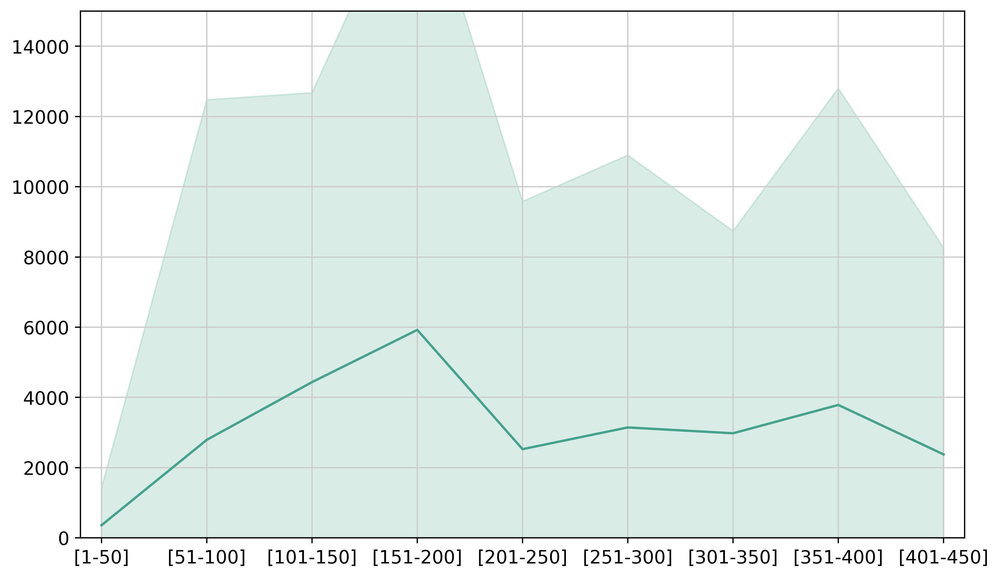

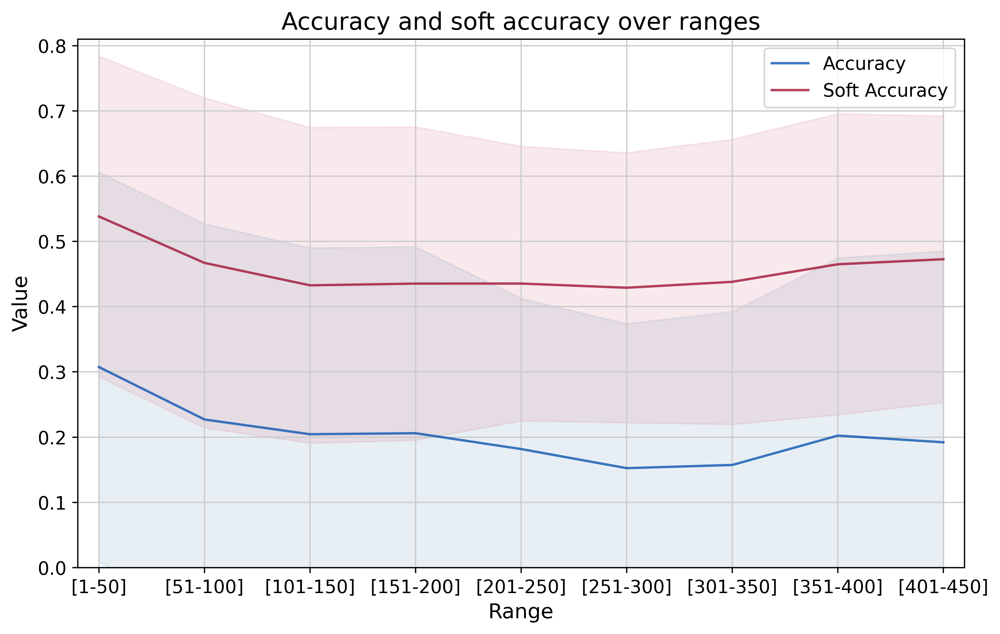

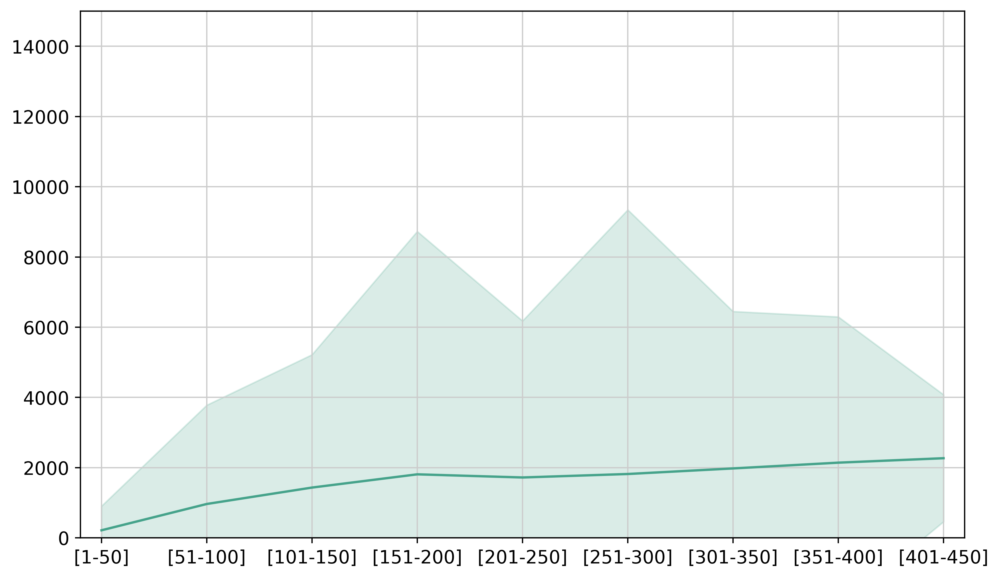

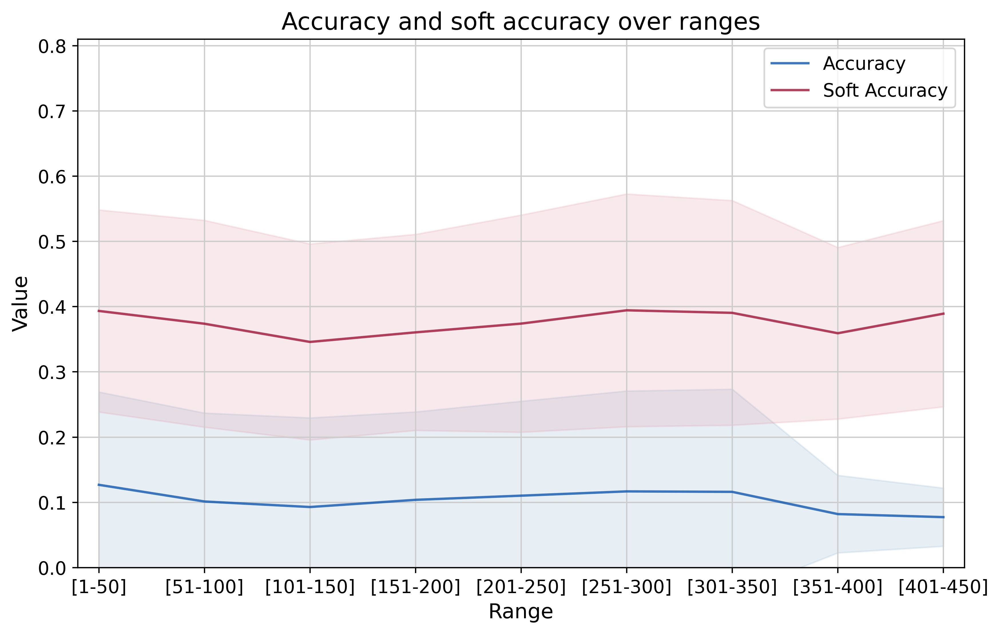

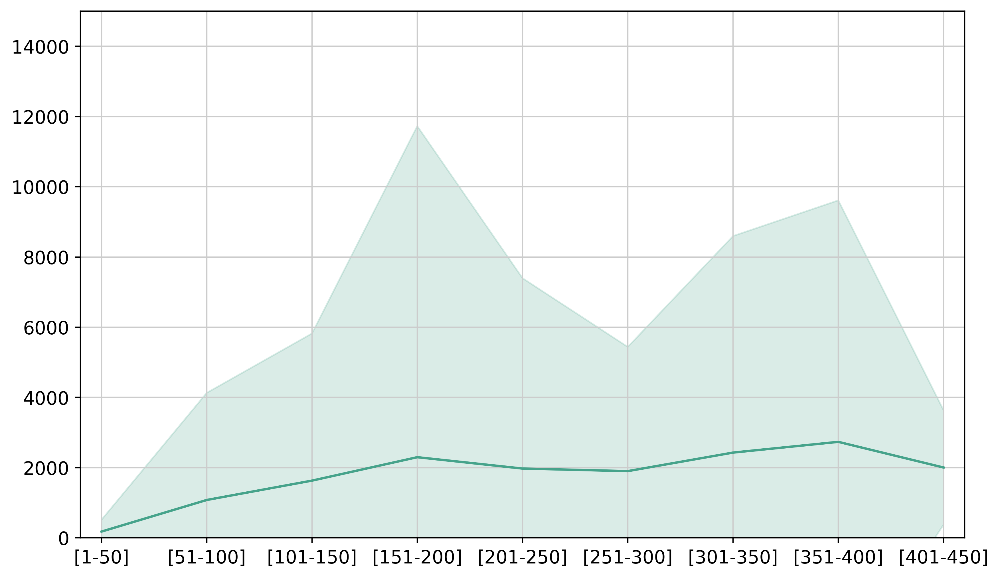

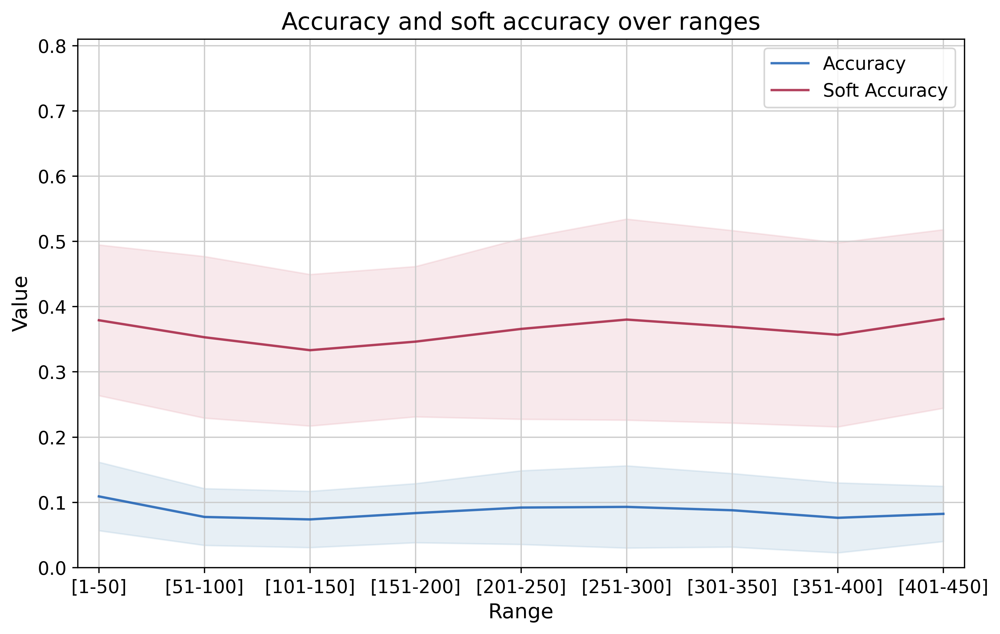

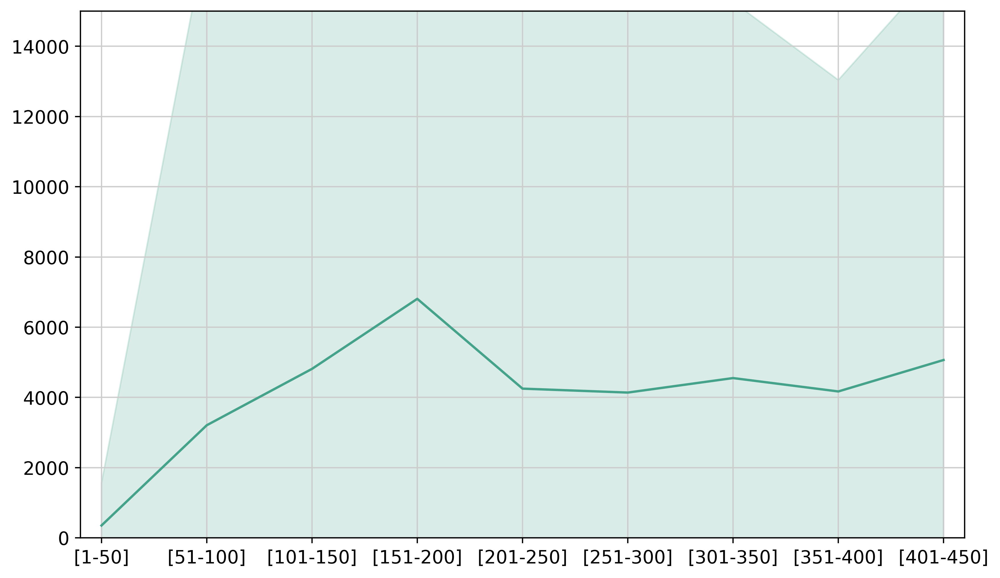

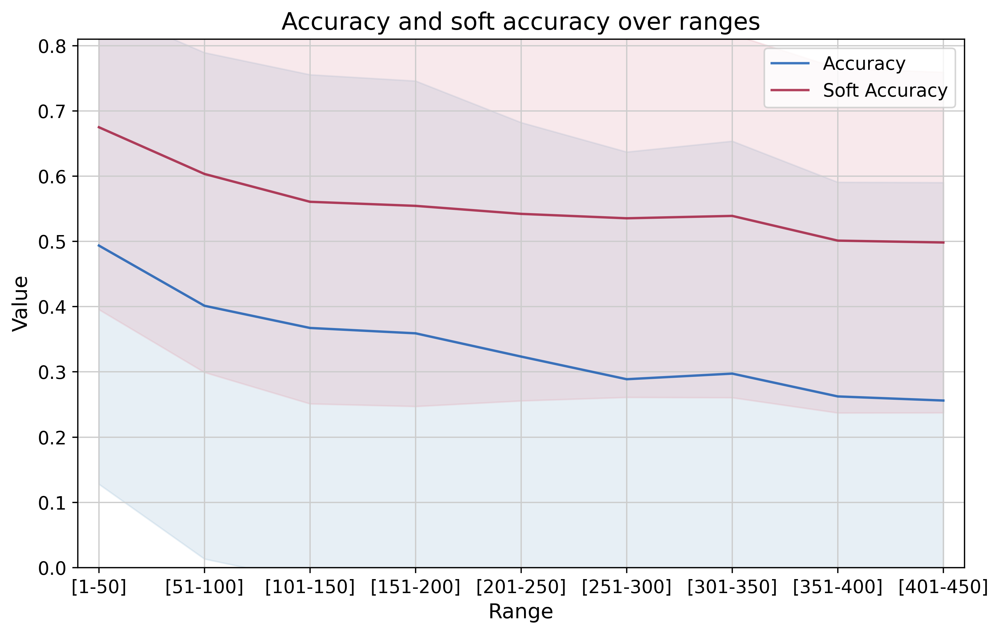

In [56]:
res_names = {}
res_names_512 = {}
acc_dict = None
soft_acc_dict = None
perp_dict = None
for i in experiments:
    #if i[:12] != 'Test_after20':
    #    continue
    res_names[i] = []
    res_names_512[i] = []
    print(i + '\n')
    results, results_512, acc_dict, soft_acc_dict, perp_dict, all_vals = compute_stats(directory_path + i + '/')
    res_names[i].append(results)
    res_names_512[i].append(results_512)
    stats_graphs(acc_dict, soft_acc_dict, perp_dict, i)

In [ ]:
after_training_res_names = {}
after_training_res_names_512 = {}
acc_dict_after_t = None
soft_acc_dict_after_t = None
perp_dict_after_t = None
for i in after_training_experiments:
    #if i != 'PF00959_after_20_TRAINING_4_2000_p_0_k_1_key_only_0':
    #    continue
    after_training_res_names[i] = []
    after_training_res_names_512[i] = []
    print(i + '\n')
    file_directory = directory_path + i + '/'
    results, results_512, acc_dict_after_t, soft_acc_dict_after_t, perp_dict_after_t, all_vals = compute_stats(file_directory)
    after_training_res_names[i].append(results)
    after_training_res_names_512[i].append(results_512)
    stats_graphs(acc_dict_after_t, soft_acc_dict_after_t, perp_dict_after_t, i)
    

<class 'list'>
Test_teacherforcing_k_1_finetuned_model_ALL_LYSOZYMES_KEYS_test_10percent

filtered ppx less than 18: how many?: 1948
value mean: 2.920465809792219
PF00959_teacher_forcing_ALL_TRAINING_4_TRAINING_2000_p_0_k_1_key_only_0

filtered ppx less than 18: how many?: 2000
value mean: 2.54041448366642
acc:
0.034040444935199914
1.180587216503457


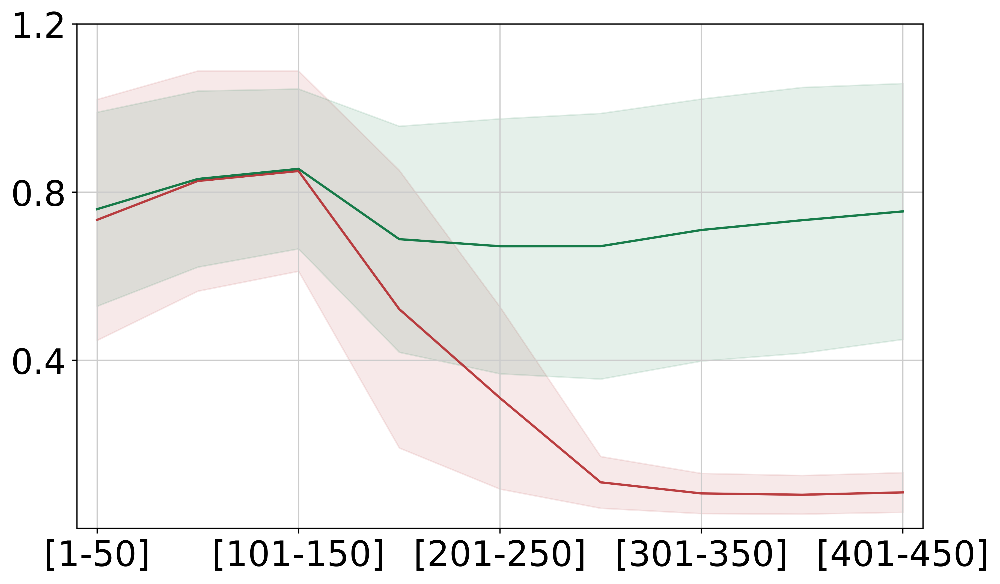

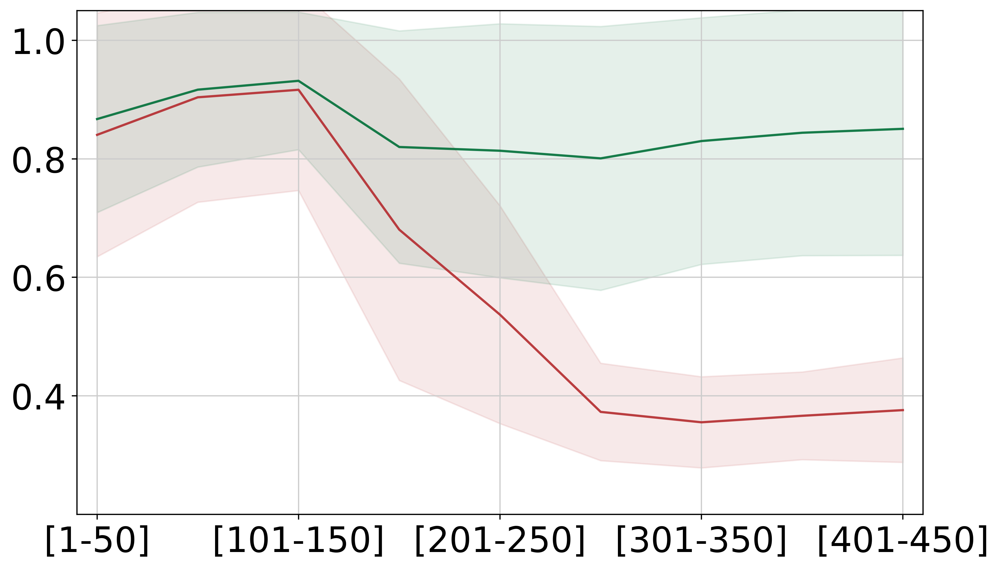

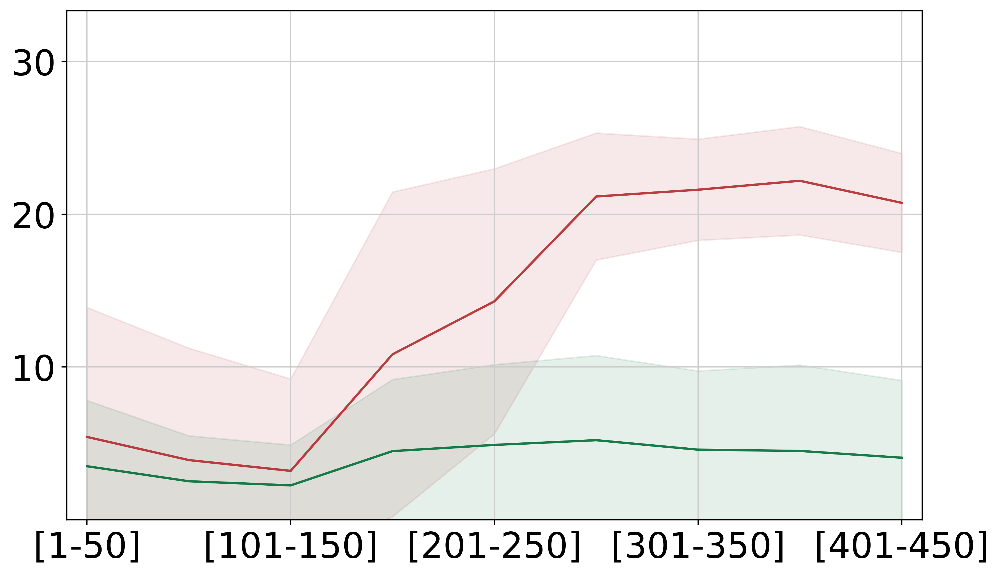

In [122]:
for exp in exp_all:
    print(type(exp))
    experiments = [exp[1]]
    after_training_experiments = [exp[0]]

    res_names = {}
    res_names_512 = {}
    acc_dict = None
    soft_acc_dict = None
    perp_dict = None
    for i in experiments:
        #TF_NEW = True
        res_names[i] = []
        res_names_512[i] = []
        print(i + '\n')
        results, results_512, acc_dict, soft_acc_dict, perp_dict, all_vals = compute_stats(directory_path + i + '/')
        res_names[i].append(results)
        res_names_512[i].append(results_512)
    after_training_res_names = {}
    after_training_res_names_512 = {}
    acc_dict_after_t = None
    soft_acc_dict_after_t = None
    perp_dict_after_t = None
    for i in after_training_experiments:
        #TF_NEW = False
        after_training_res_names[i] = []
        after_training_res_names_512[i] = []
        print(i + '\n')
        file_directory = directory_path + i + '/'
        results, results_512, acc_dict_after_t, soft_acc_dict_after_t, perp_dict_after_t, all_vals = compute_stats(file_directory)
        after_training_res_names[i].append(results)
        after_training_res_names_512[i].append(results_512)
    name = exp[1]
    stats_graphs_comparison(name, acc_dict, soft_acc_dict, perp_dict, acc_dict_after_t, soft_acc_dict_after_t, perp_dict_after_t)
    

In [ ]:
if len(res_names_512) != 1:
    print('Something wrong for stats comparison 1')
if len(after_training_res_names_512) != 1:
    print('Something wrong for stats comparison 2')
name ='experiment_name'
stats_graphs_comparison(name, acc_dict, soft_acc_dict, perp_dict, acc_dict_after_t, soft_acc_dict_after_t, perp_dict_after_t)

<h3>ALL ECs toghether computation</h3>

Test_teacherforcing_k_1_general_model_2-1-1-37_NOKEYS_test_5percent

filtered ppx less than 18: how many?: 1814
value mean: 6.9777699991518505
Test_teacherforcing_k_1_general_model_5_4_99_5_NOKEYS_test_10percent

filtered ppx less than 18: how many?: 1790
value mean: 6.333720595210624
Test_teacherforcing_k_1_general_model_ec4-1-1-39_KEYS_test_5percent

filtered ppx less than 18: how many?: 6305
value mean: 1.37097092769526
Test_teacherforcing_k_1_general_model_1-1-1-1_KEYS_test_5percent

filtered ppx less than 18: how many?: 2321
value mean: 3.642543782144207
Test_teacherforcing_k_1_general_model_7-2-1-1_KEYS_test_5percent

filtered ppx less than 18: how many?: 1696
value mean: 3.8596031047263235
Test_teacherforcing_k_1_general_model_NOKEYS_test_EC6-3-4-15_5percent

filtered ppx less than 18: how many?: 1698
value mean: 6.708695131701772
Test_teacherforcing_k_1_general_model_NOKEYS_model_all_molechules_test10percent

filtered ppx less than 18: how many?: 1900
value mean: 4.448588451649

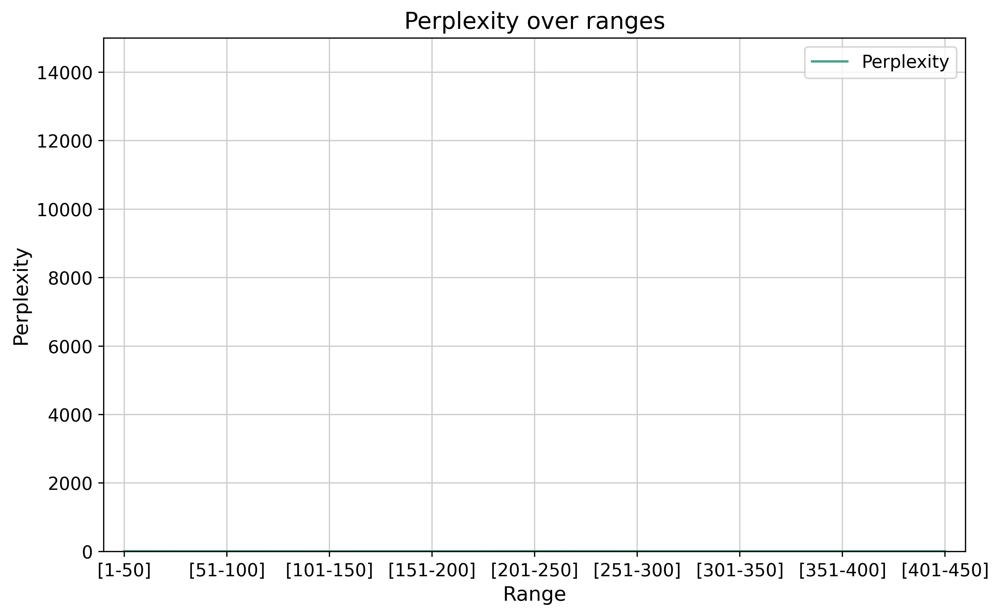

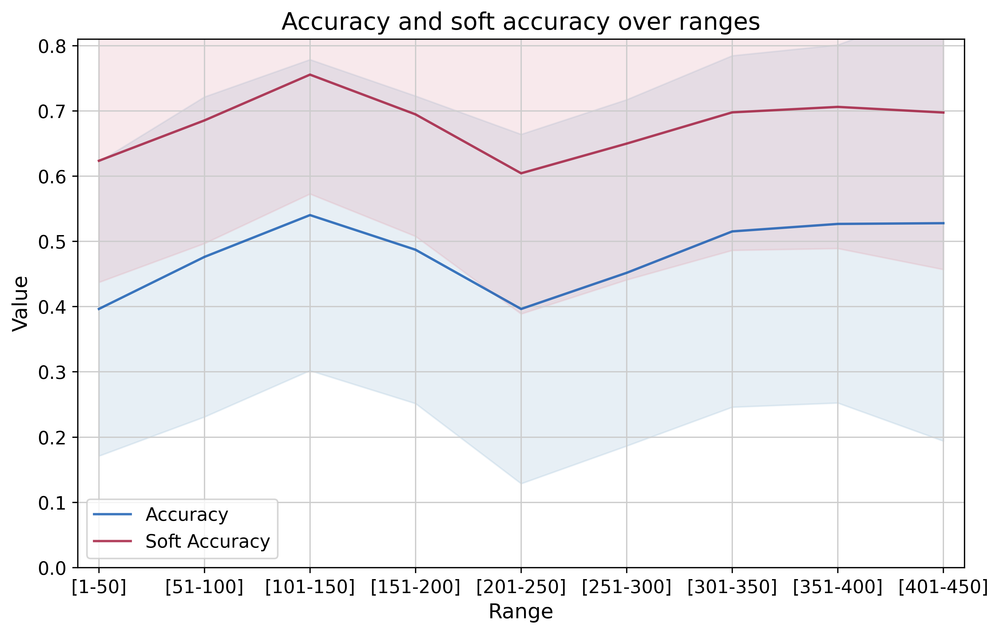

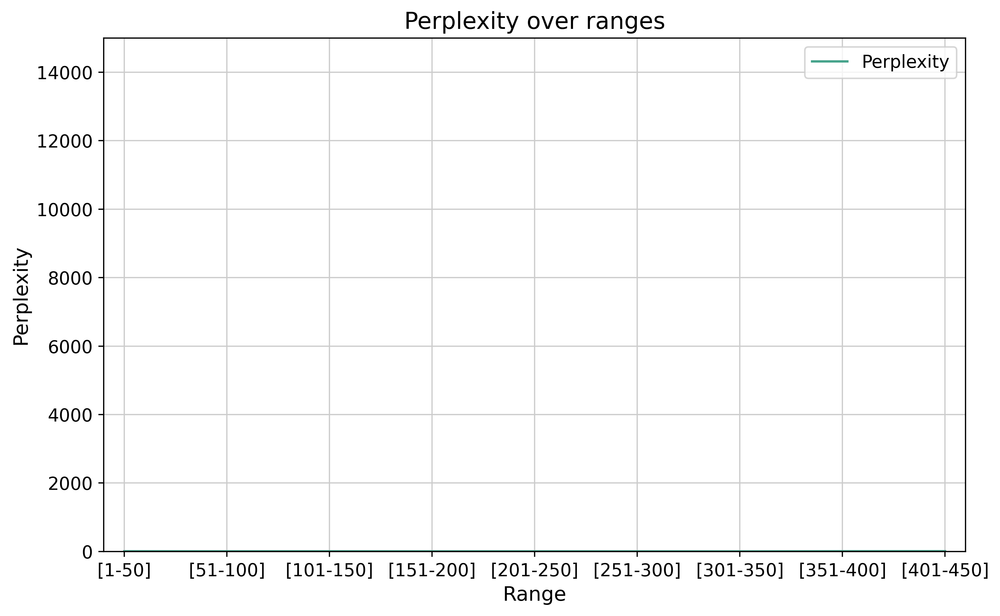

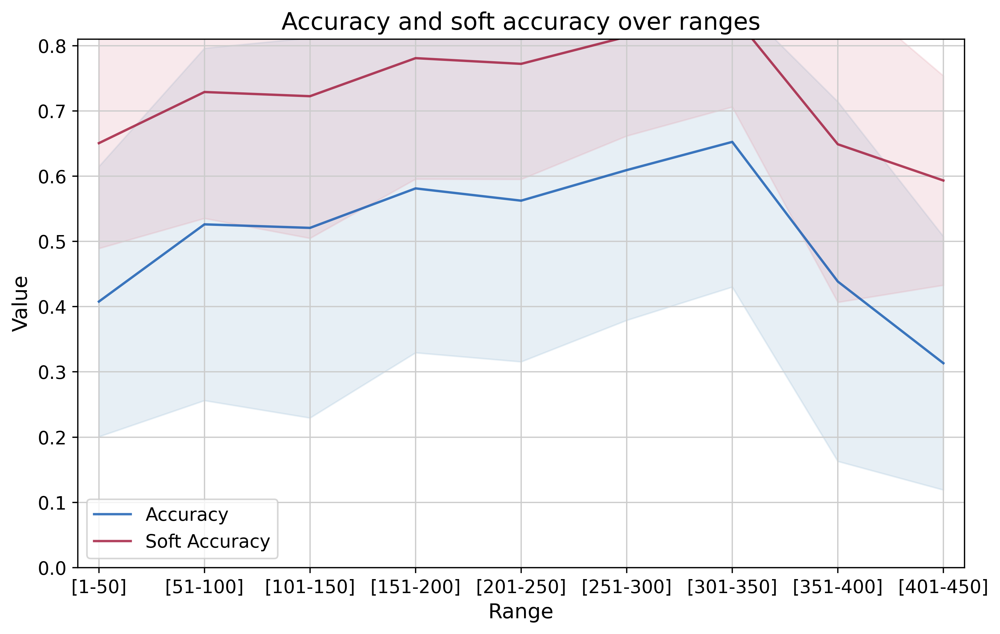

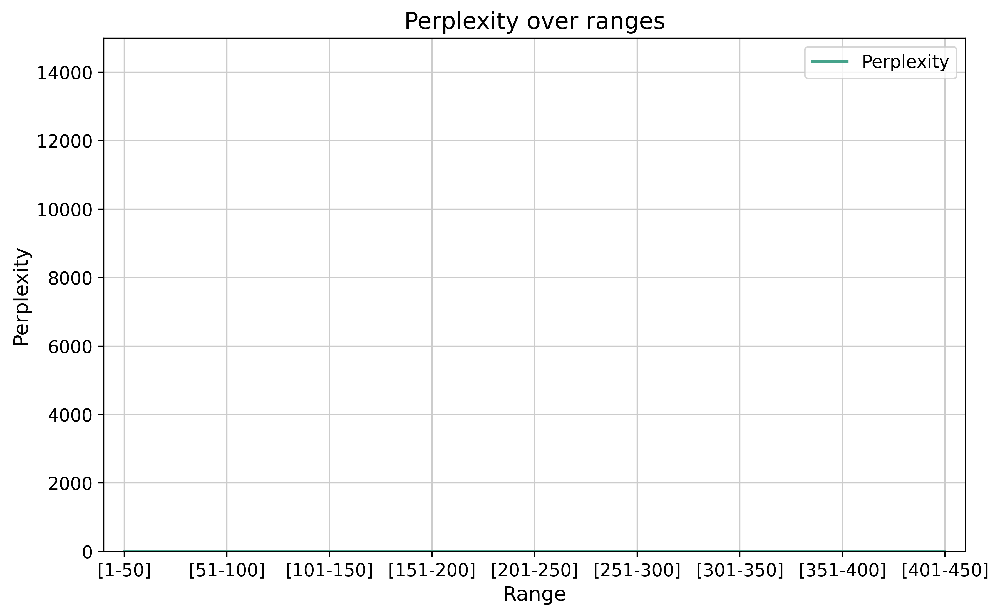

...

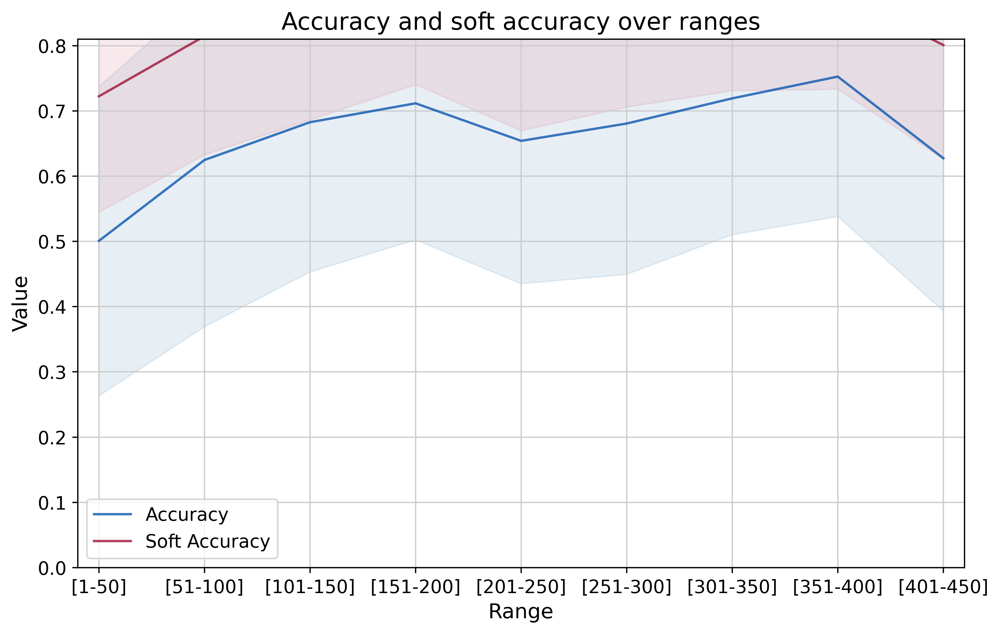

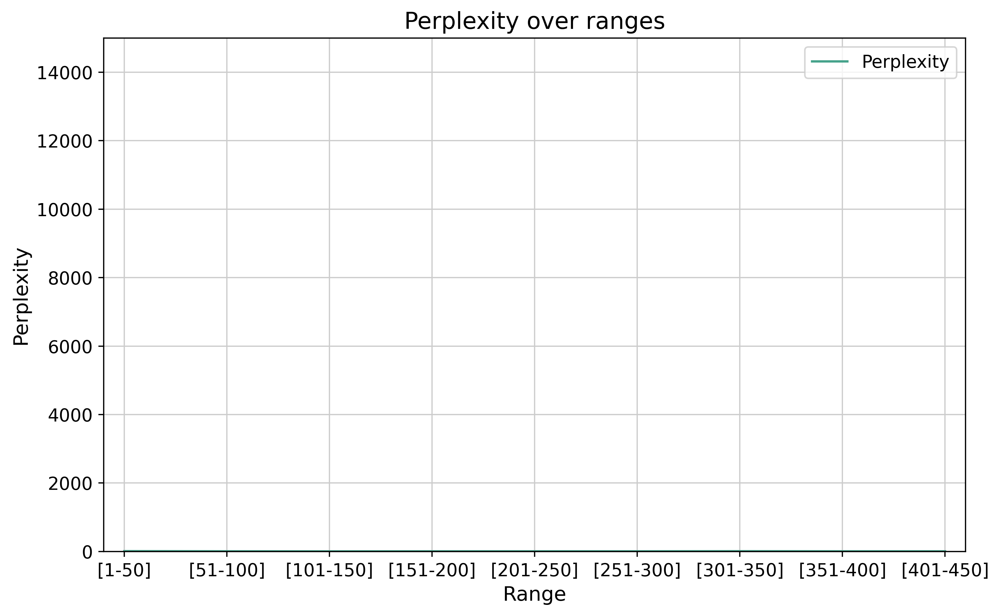

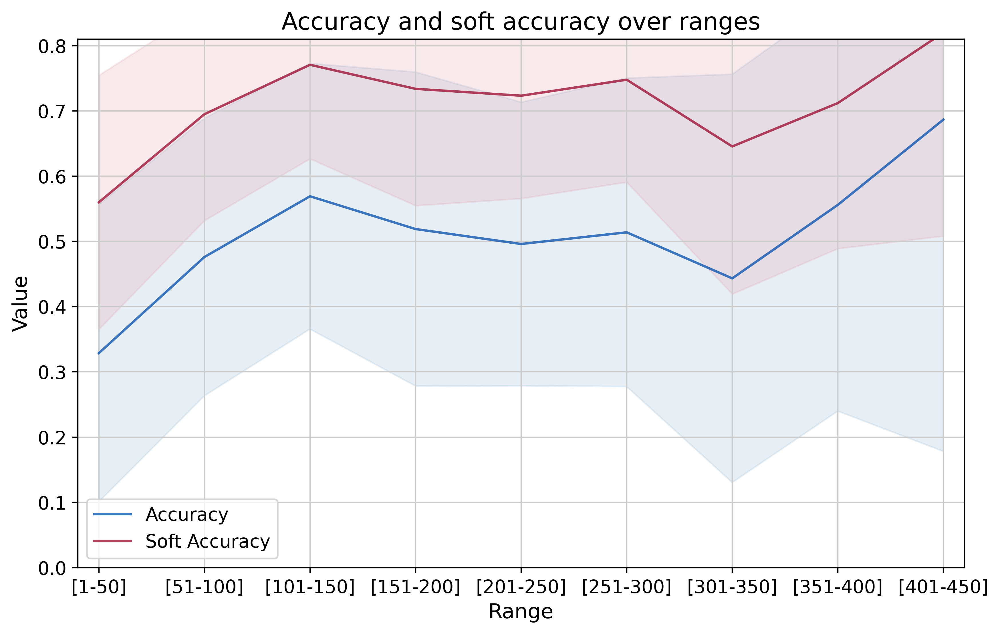

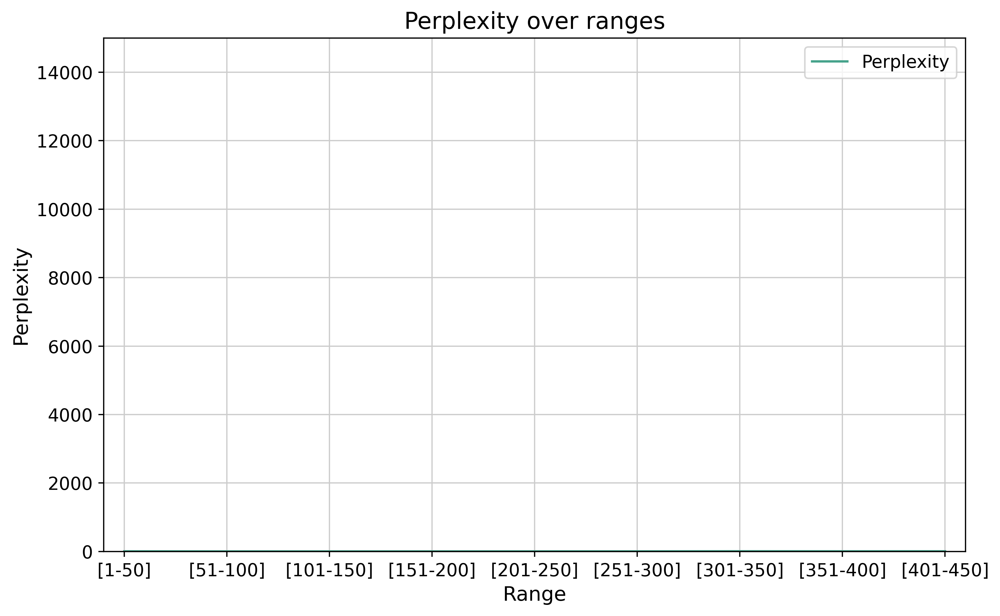

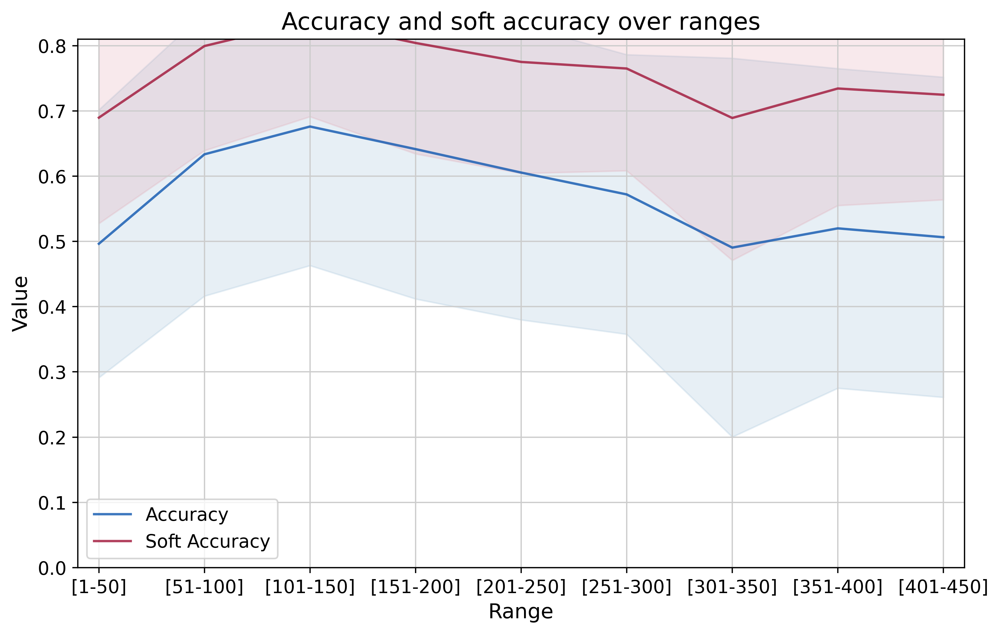

In [216]:
res_names = {}
res_names_512 = {}
acc_dict_all = []
soft_acc_dict_all = []
perp_dict_all = []

for i in experiments_todo:
    if 'general' not in i:
        continue
    if 'percent' not in i:
        continue
    res_names[i] = []
    res_names_512[i] = []
    print(i + '\n')
    results, results_512, acc_dict, soft_acc_dict, perp_dict, all_vals = compute_stats(directory_path + i + '/')
    res_names[i].append(results)
    res_names_512[i].append(results_512)
    stats_graphs(acc_dict, soft_acc_dict, perp_dict, i)
    acc_dict_all.append(acc_dict)
    soft_acc_dict_all.append(soft_acc_dict)
    perp_dict_all.append(perp_dict)


In [217]:
# now we compute average of all accuracies, soft accuracies and perplexities dict
acc_dict_avg = {}
soft_acc_dict_avg = {}
perp_dict_avg = {}

for i in range(len(acc_dict_all)):
    for key in range(0, 450, 50):
        if key not in acc_dict_avg and perp_dict_all[i][key] != []:
            acc_dict_avg[key] = []
            acc_dict_avg[key].append(acc_dict_all[i][key])
        elif acc_dict_all[i][key] != []:
            acc_dict_avg[key].append(acc_dict_all[i][key])

        if key not in soft_acc_dict_avg and perp_dict_all[i][key] != []:
            soft_acc_dict_avg[key] = []
            soft_acc_dict_avg[key].append(soft_acc_dict_all[i][key])
        elif soft_acc_dict_all[i][key] != []:
            soft_acc_dict_avg[key].append(soft_acc_dict_all[i][key])

        if key not in perp_dict_avg and perp_dict_all[i][key] != []:
            perp_dict_avg[key] = []
            perp_dict_avg[key].append(perp_dict_all[i][key])
        elif perp_dict_all[i][key] != []:
            perp_dict_avg[key].append(perp_dict_all[i][key])

#print(perp_dict_avg)


# now i have for each key a list of tuples with value and standard deviation, 
# now i compute the average of the values and of the standard deviations
for key in range(0, 450, 50):
    acc_dict_avg[key] = (sum([x[0] for x in acc_dict_avg[key]])/len(acc_dict_avg[key]), np.std([x[0] for x in acc_dict_avg[key]]))
    soft_acc_dict_avg[key] = (sum([x[0] for x in soft_acc_dict_avg[key]])/len(soft_acc_dict_avg[key]), np.std([x[0] for x in soft_acc_dict_avg[key]]))
    perp_dict_avg[key] = (sum([x[0] for x in perp_dict_avg[key]])/len(perp_dict_avg[key]), np.std([x[0] for x in perp_dict_avg[key]]))

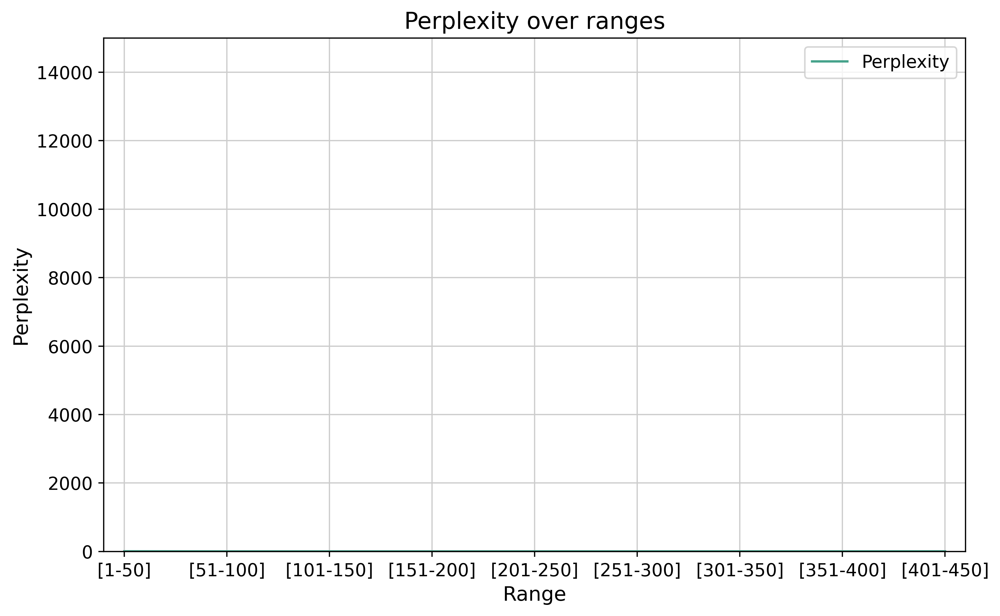

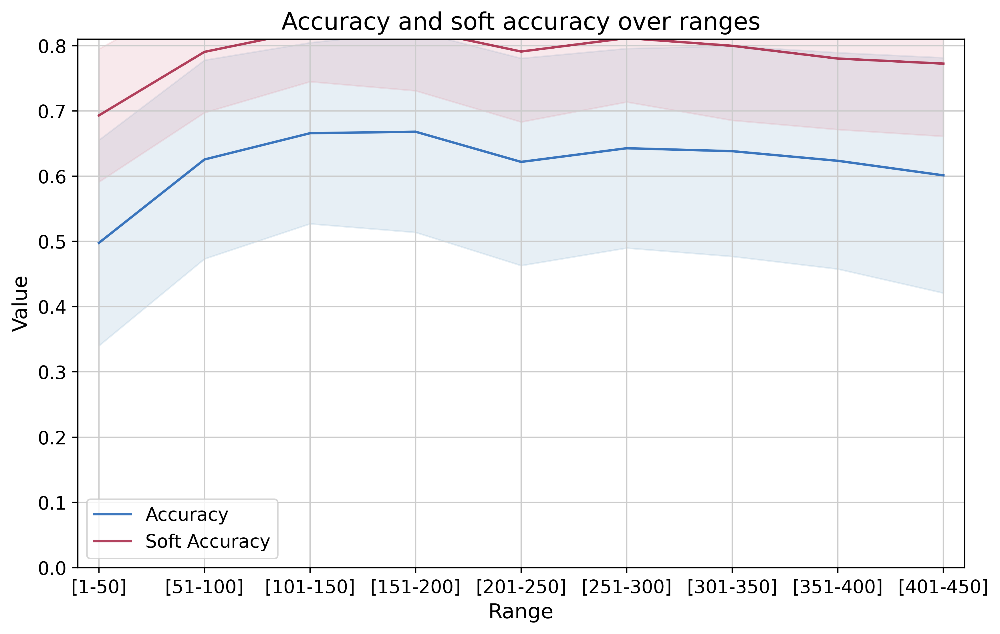

In [218]:
stats_graphs(acc_dict_avg, soft_acc_dict_avg, perp_dict_avg, 'average') # graphs for average values

Test_teacherforcing_k_1_finetuned_model_5_4_99_5_4epochs_warmup1000_KEYS_test_10percent

filtered ppx less than 18: how many?: 1798
value mean: 2.4042592137488428
Test_teacherforcing_k_1_finetuned_model_4epochs_warmup1000_7-2-1-1_KEYS_test_5percent

filtered ppx less than 18: how many?: 1696
value mean: 1.7857792180664134
Test_teacherforcing_k_1_finetuned_model_epoch4_ec4-1-1-39_KEYS_test_5percent

filtered ppx less than 18: how many?: 6307
value mean: 1.1307861308619056
Test_teacherforcing_k_1_finetuned_model_ep4_KEYS_test_EC6-3-4-15_5percent

filtered ppx less than 18: how many?: 1700
value mean: 3.155363396125681
Test_teacherforcing_k_1_fine-tuned_modelFLIPPED_6epochs_KEYS_model_all_molechules_test10percent

filtered ppx less than 18: how many?: 1903
value mean: 2.742961820651529
Test_teacherforcing_k_1_finetuned_model_model_6epochs_warmup_1000_2-1-1-37_KEYS_test_5percent

filtered ppx less than 18: how many?: 1878
value mean: 3.0595245773926836
Test_teacherforcing_k_1_finetuned_mod

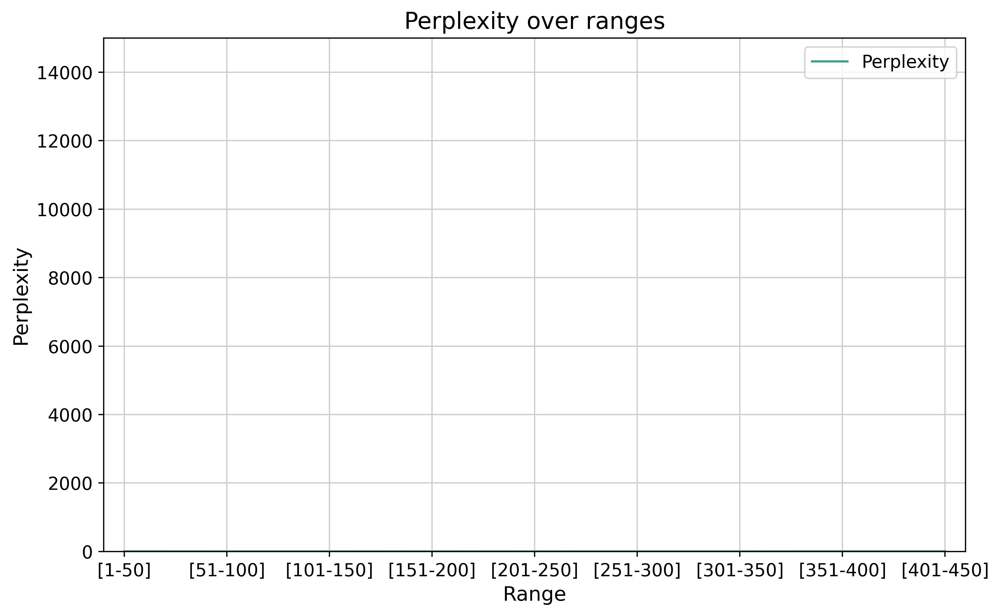

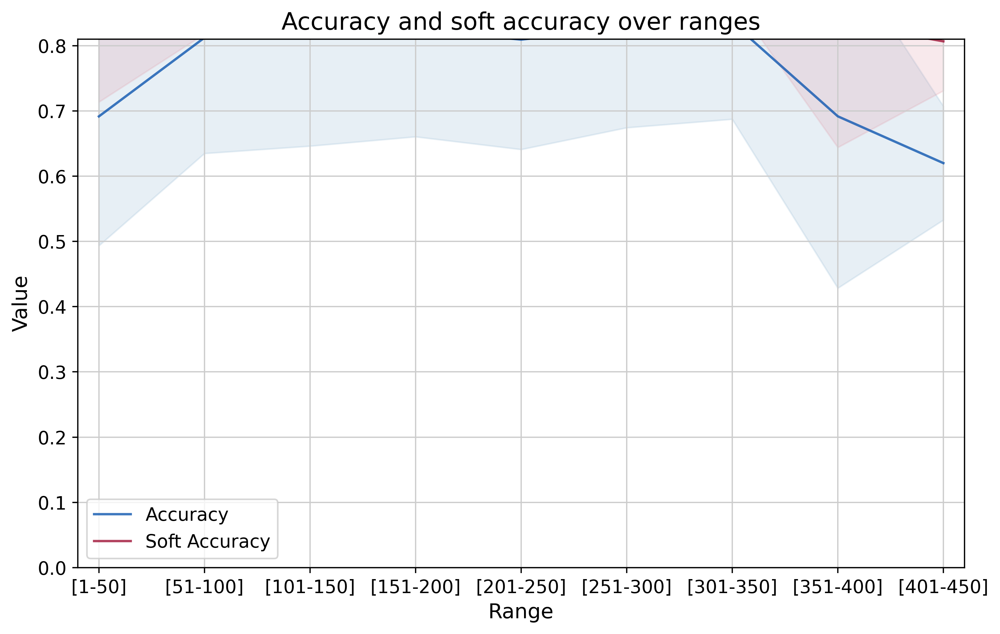

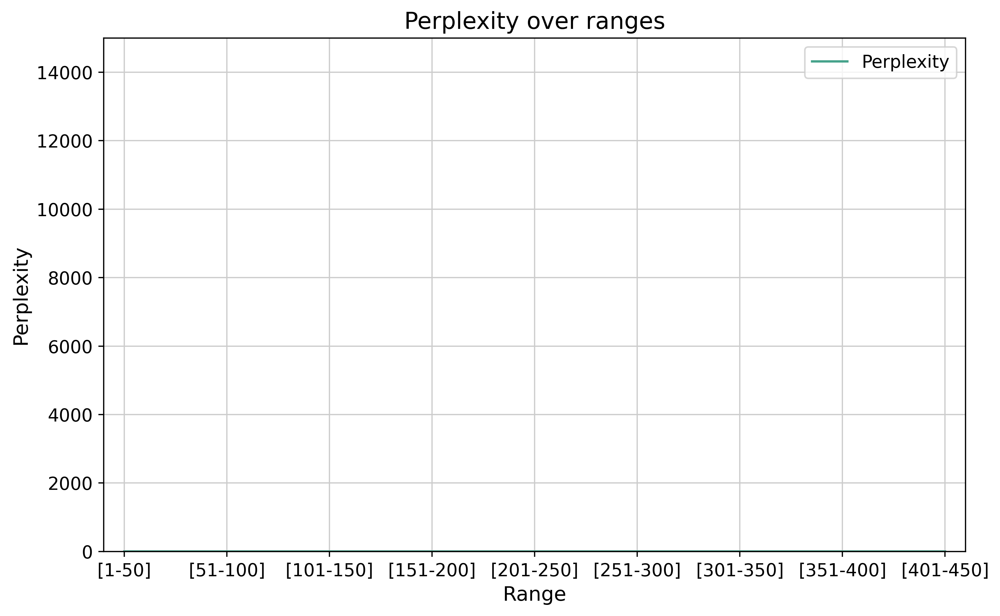

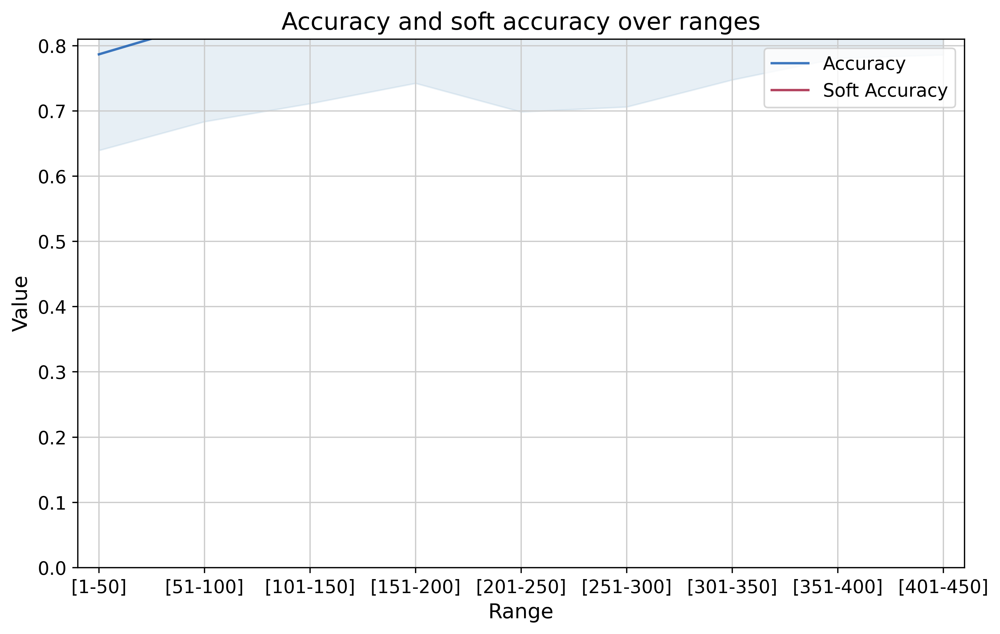

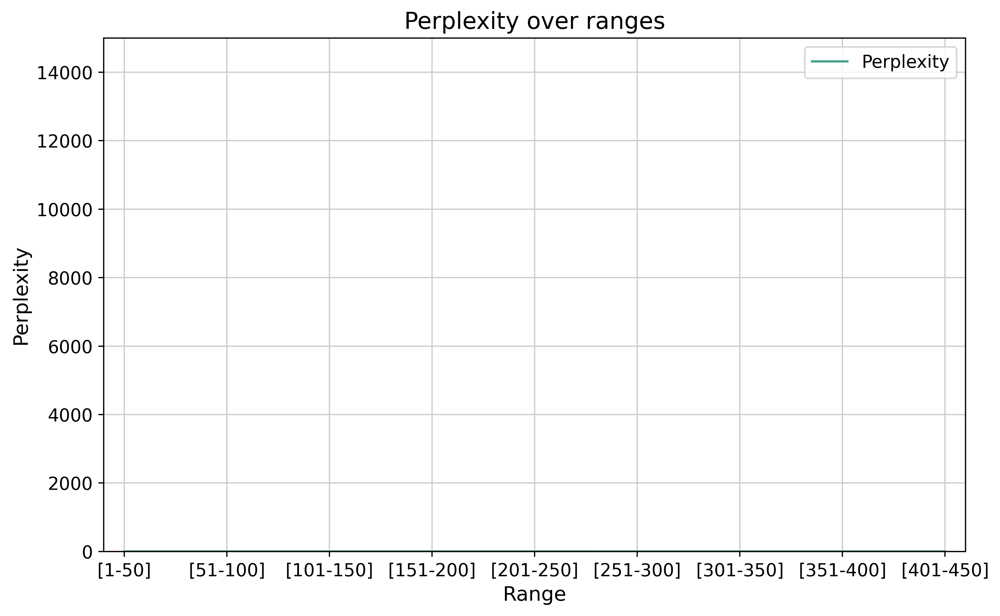

...

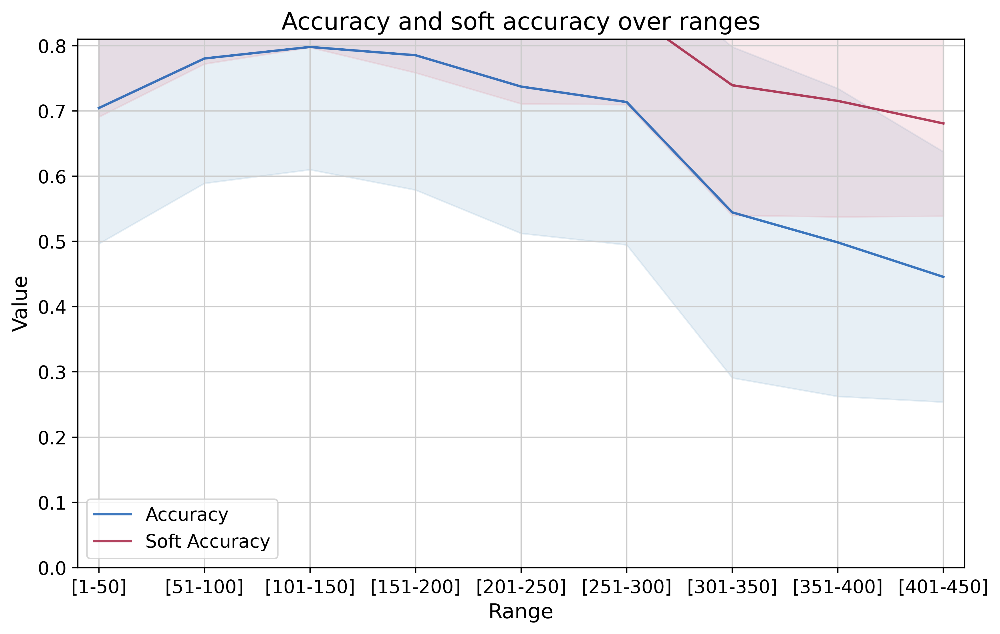

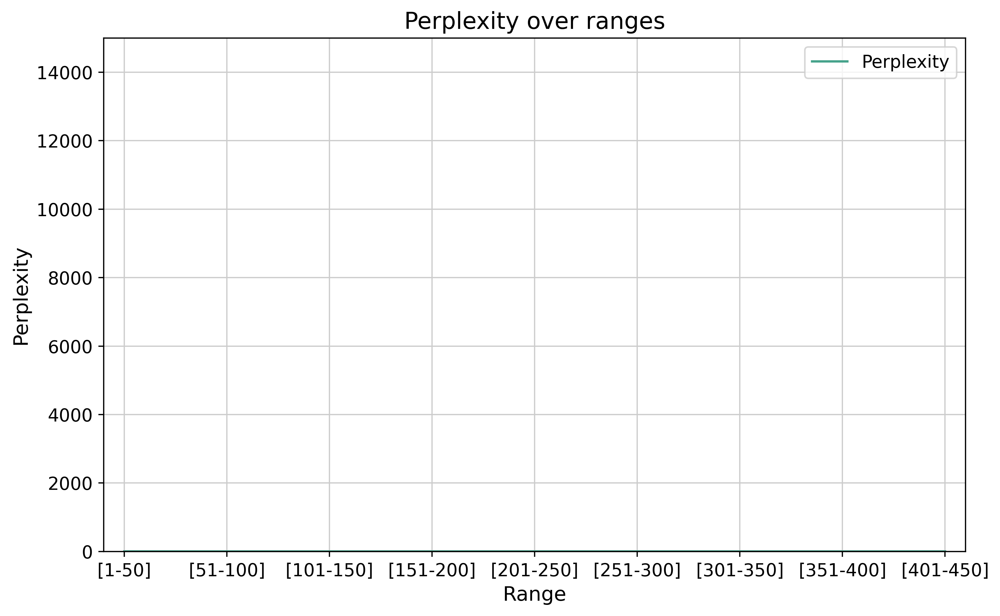

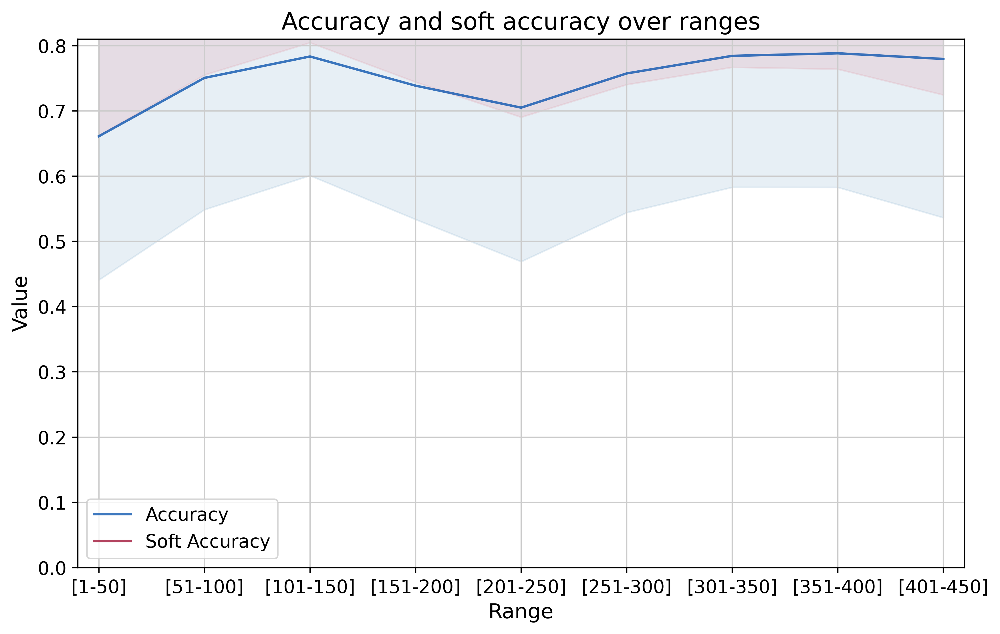

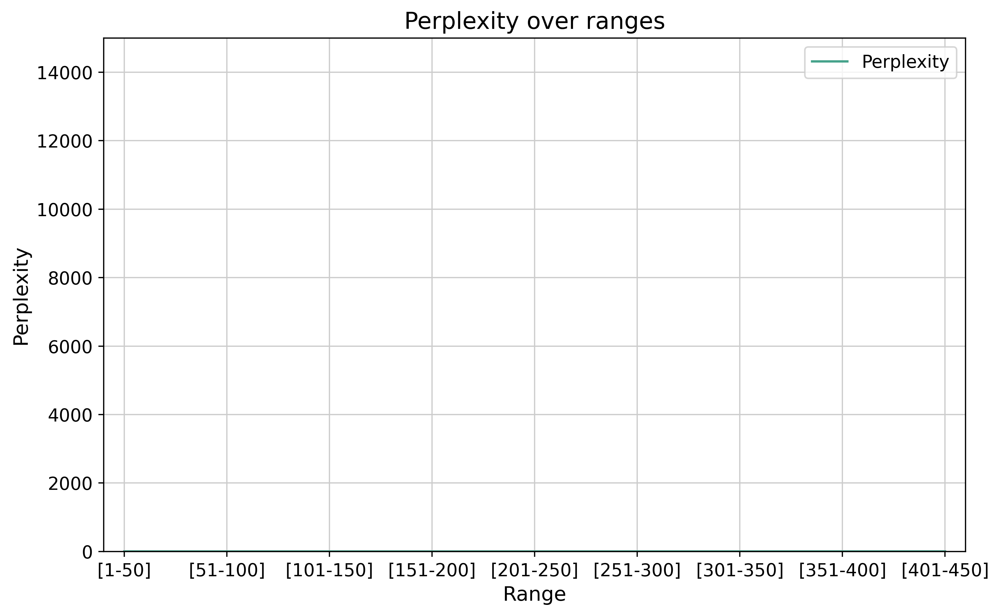

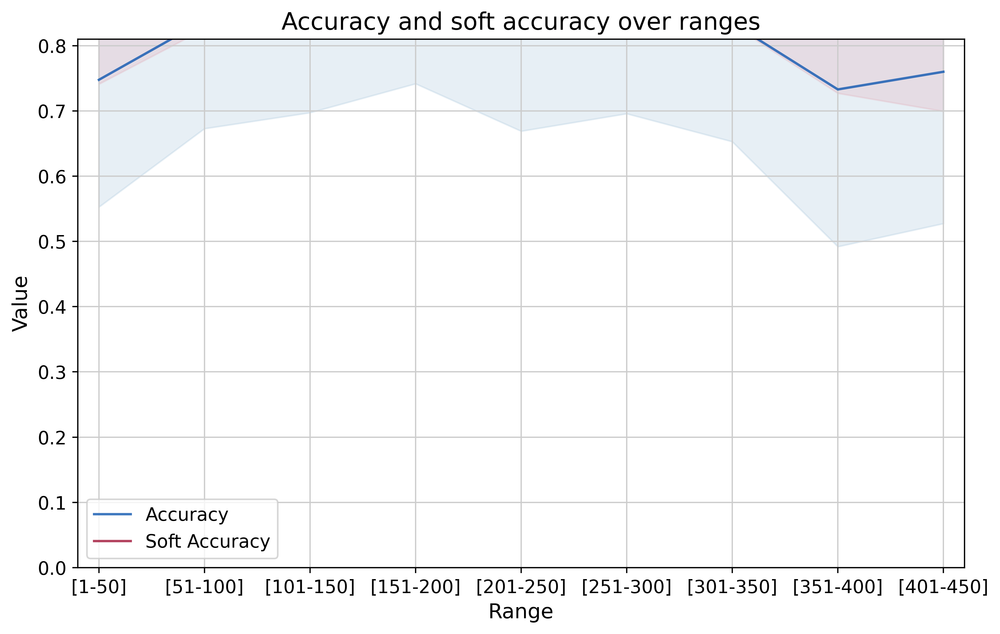

In [219]:
res_names = {}
res_names_512 = {}
acc_dict_all = []
soft_acc_dict_all = []
perp_dict_all = []

for i in experiments_todo:
    if 'general' in i:
        continue
    if 'percent' not in i:
        continue
    res_names[i] = []
    res_names_512[i] = []
    print(i + '\n')
    results, results_512, acc_dict, soft_acc_dict, perp_dict, all_vals = compute_stats(directory_path + i + '/')
    res_names[i].append(results)
    res_names_512[i].append(results_512)
    stats_graphs(acc_dict, soft_acc_dict, perp_dict, i)
    acc_dict_all.append(acc_dict)
    soft_acc_dict_all.append(soft_acc_dict)
    perp_dict_all.append(perp_dict)


In [220]:
# now we compute average of all accuracies, soft accuracies and perplexities dict
acc_dict_after_t = {}
soft_acc_dict_after_t = {}
perp_dict_after_t = {}

for i in range(len(acc_dict_all)):
    for key in range(0, 450, 50):
        if key not in acc_dict_after_t and acc_dict_all[i][key] != []:
            acc_dict_after_t[key] = []
            acc_dict_after_t[key].append(acc_dict_all[i][key])
        elif acc_dict_all[i][key] != []:
            acc_dict_after_t[key].append(acc_dict_all[i][key])

        if key not in soft_acc_dict_after_t and soft_acc_dict_all[i][key] != []:
            soft_acc_dict_after_t[key] = []
            soft_acc_dict_after_t[key].append(soft_acc_dict_all[i][key])
        elif soft_acc_dict_all[i][key] != []:
            soft_acc_dict_after_t[key].append(soft_acc_dict_all[i][key])

        if key not in perp_dict_after_t and perp_dict_all[i][key] != []:
            perp_dict_after_t[key] = []
            perp_dict_after_t[key].append(perp_dict_all[i][key])
        elif perp_dict_all[i][key] != []:
            perp_dict_after_t[key].append(perp_dict_all[i][key])


# now i have for each key a list of tuples with value and standard deviation, 
# now i compute the average of the values and of the standard deviations
for key in range(0, 450, 50):
    acc_dict_after_t[key] = (sum([x[0] for x in acc_dict_after_t[key]])/len(acc_dict_after_t[key]), np.std([x[0] for x in acc_dict_after_t[key]]))
    soft_acc_dict_after_t[key] = (sum([x[0] for x in soft_acc_dict_after_t[key]])/len(soft_acc_dict_after_t[key]), np.std([x[0] for x in soft_acc_dict_after_t[key]]))
    perp_dict_after_t[key] = (sum([x[0] for x in perp_dict_after_t[key]])/len(perp_dict_after_t[key]), np.std([x[0] for x in perp_dict_after_t[key]]))

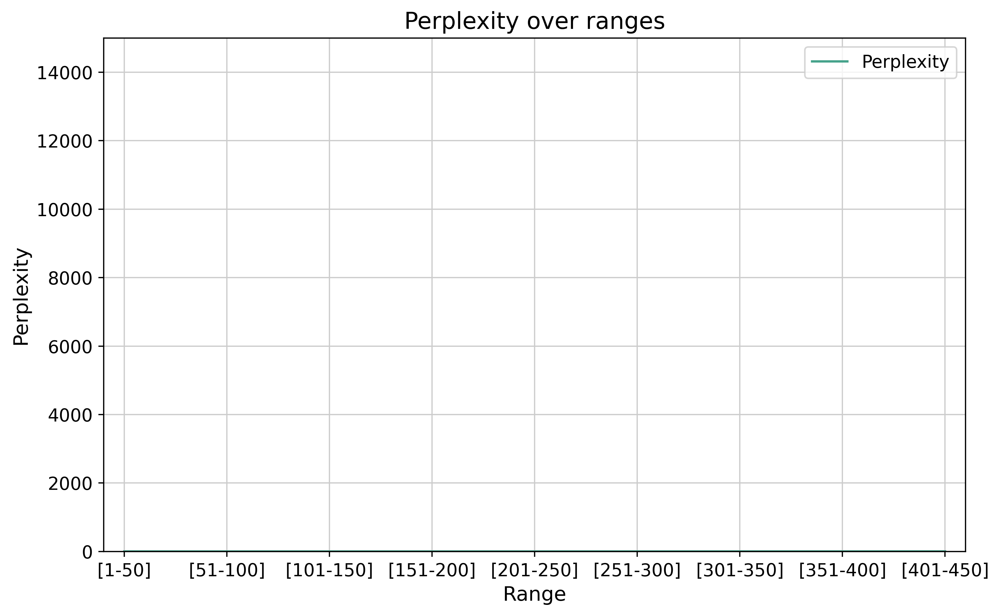

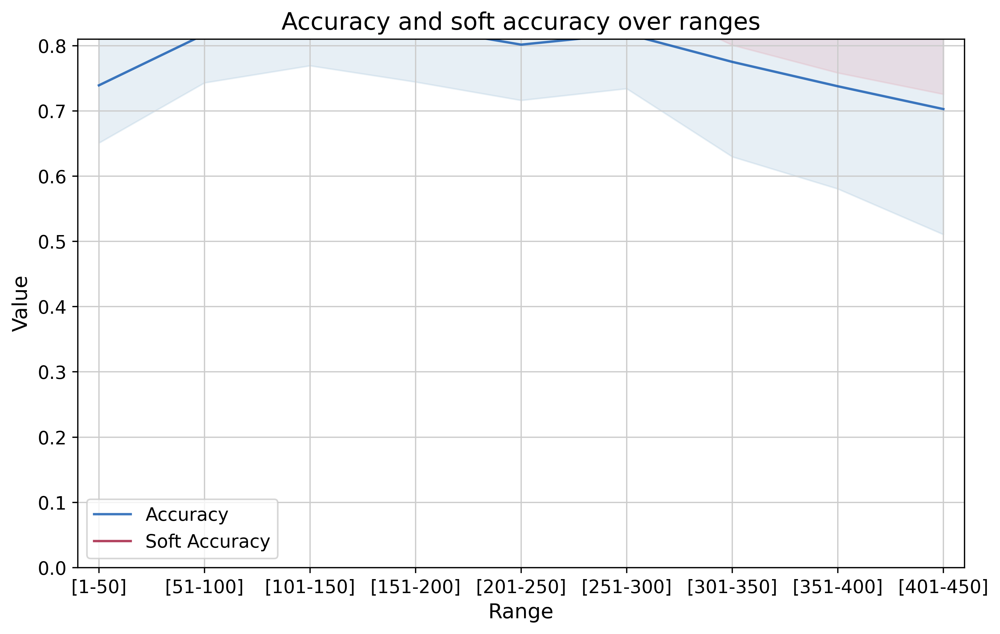

In [221]:
stats_graphs(acc_dict_after_t, soft_acc_dict_after_t, perp_dict_after_t, 'average_after_tuning_nofilter') # graphs for average values

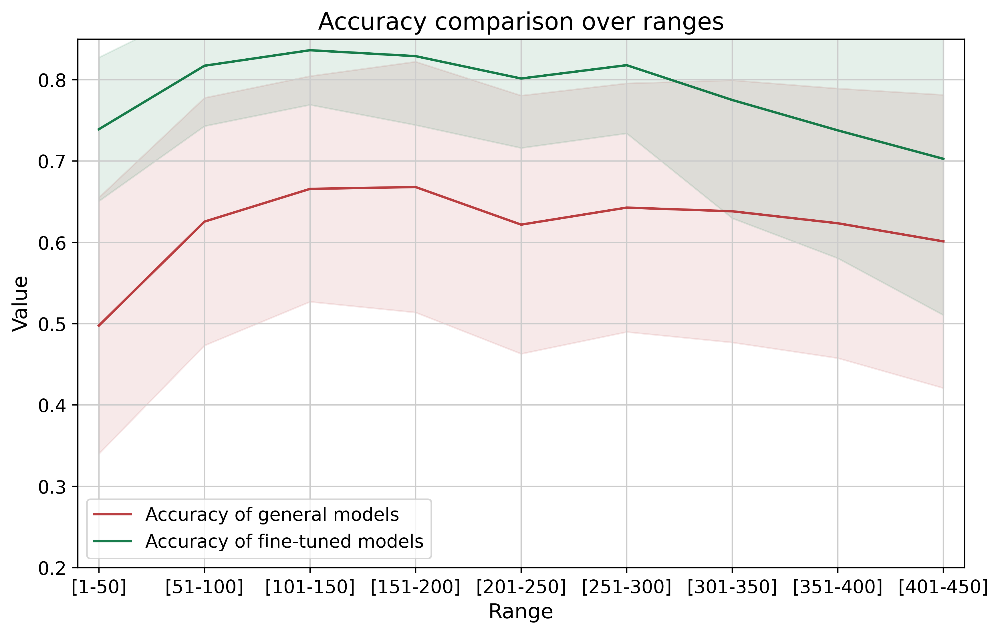

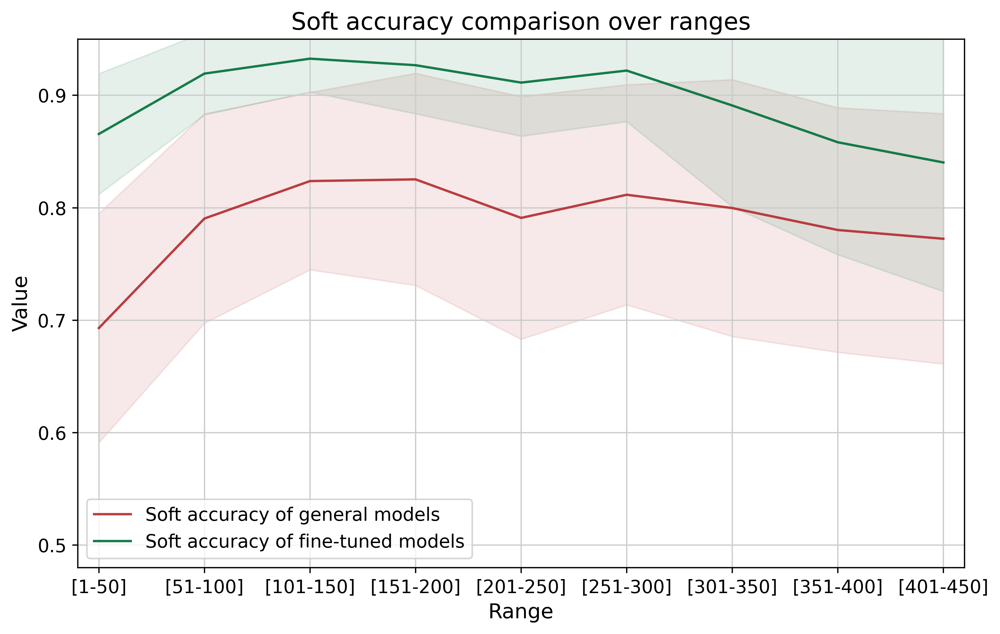

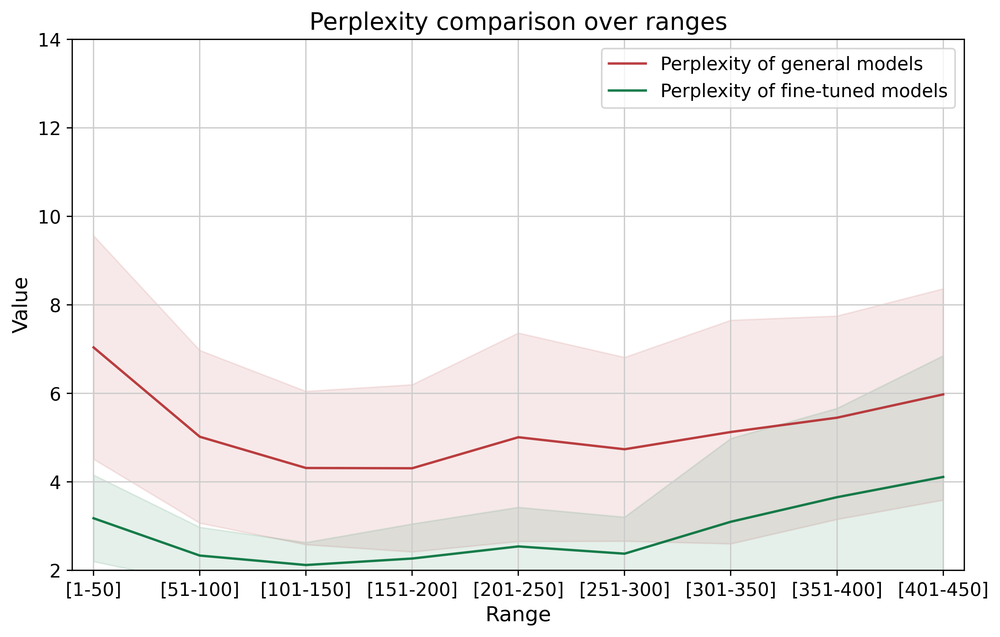

In [222]:
stats_graphs_comparison(name, acc_dict_avg, soft_acc_dict_avg, perp_dict_avg, acc_dict_after_t, soft_acc_dict_after_t, perp_dict_after_t)

In [57]:
print("\\begin{table}[]")
print("\\label{tab:labellllll}")
print("\\begin{tabular}{|l|l|l|l|l|l|l|}")
print("\\hline")
print("\\textbf{Test size} & $p$ & $k$ & \\textbf{Kw} & & \\textbf{Accuracy} & \\textbf{Soft accuracy} & \\textbf{Perplexity} \\\\ \\hline")
for key in res_names_512:
    print(key, res_names_512[key][0], " \\\\ \\hline")
print("\\end{tabular}")
print("\\caption{caption...}")
print("\\end{table}")

\begin{table}[]
\label{tab:labellllll}
\begin{tabular}{|l|l|l|l|l|l|l|}
\hline
\textbf{Test size} & $p$ & $k$ & \textbf{Kw} & & \textbf{Accuracy} & \textbf{Soft accuracy} & \textbf{Perplexity} \\ \hline
Test_after20_k_1_finetuned_model_epoch5_3-2-1-4_KEYS_test_reduced  & $19.899$/$21.931$ & $44.773$/$18.452$ & $1285.797$/$2608.61$   \\ \hline
Test_after20_k_1_general_model_3-2-1-4_KEYS_test_10percent  & $10.588$/$12.106$ & $37.359$/$13.718$ & $724.672$/$1300.443$   \\ \hline
Test_after20_k_1_general_model_3-2-1-4_KEYS_test_reduced  & $8.953$/$3.541$ & $36.094$/$10.348$ & $773.563$/$1426.138$   \\ \hline
Test_after20_k_1_finetuned_model_epoch5_3-2-1-4_KEYS_test_10percent  & $36.3$/$33.511$ & $57.215$/$25.821$ & $1301.673$/$3092.602$   \\ \hline
\end{tabular}
\caption{caption...}
\end{table}


In [45]:
print("\\begin{table}[]")
print("\\label{tab:labellllll}")
print("\\begin{tabular}{|l|l|l|l|l|l|l|}")
print("\\hline")
print("\\textbf{Test size} & $p$ & $k$ & \\textbf{Kw} & & \\textbf{Accuracy} & \\textbf{Soft accuracy} & \\textbf{Perplexity} \\\\ \\hline")
for key in after_training_res_names:
    print(key, after_training_res_names[key][0], " \\\\ \\hline")
print("\\end{tabular}")
print("\\caption{caption...}")
print("\\end{table}")

\begin{table}[]
\label{tab:labellllll}
\begin{tabular}{|l|l|l|l|l|l|l|}
\hline
\textbf{Test size} & $p$ & $k$ & \textbf{Kw} & & \textbf{Accuracy} & \textbf{Soft accuracy} & \textbf{Perplexity} \\ \hline
Test_after20_k_1_finetuned_model_epoch5_3-2-1-4_KEYS_test_reduced  & $19.899$/$21.96$ & $44.773$/$18.476$ & $1285.797$/$2608.61$   \\ \hline
\end{tabular}
\caption{caption...}
\end{table}


In [ ]:
print("\\begin{table}[]")
print("\\label{tab:labellllll}")
print("\\begin{tabular}{|l|l|l|l|l|l|l|}")
print("\\hline")
print("\\textbf{Test size} & $p$ & $k$ & \\textbf{Kw} & & \\textbf{Accuracy} & \\textbf{Soft accuracy} & \\textbf{Perplexity} \\\\ \\hline")
for key in after_training_res_names_512:
    print(key, after_training_res_names_512[key][0], " \\\\ \\hline")
print("\\end{tabular}")
print("\\caption{caption...}")
print("\\end{table}")

<h3>Code to make understand and debug</h3>

In [ ]:
# DEVELOPMENT
# Example usage of perplexity computation
probs_all = [[[[0.3, 0.7]], [[0.6, 0.4]]], [[[0.2, 0.8]], [[0.5, 0.5]]]]
indexes_all = [[[0], [1]], [[1], [0]]]

perplexity = compute_perplexities(probs_all, indexes_all, predicted_data)
print("perplexity:", perplexity)


In [ ]:
# DEVELOPMENT
# Example usage of hard and soft accuracy computation
true_sequences =      ['LS', 'LLPL', 'OOOOOOO'] # List of true sequences MITIMMNFHN
predicted_sequences = ['MS', 'OOOO', 'ASSSSSS']  # List of predicted sequences

# Compute hard accuracy
accuracy = compute_all_hard_accuracies(true_sequences, predicted_sequences)

# Compute soft accuracy
soft_accuracy = compute_soft_accuracies(true_sequences, predicted_sequences)

print("Accuracy:", accuracy, "\nSoft accuracy:", soft_accuracy)